In this notebook, the performance of six reinforcement learning agents trained to play Pong will be analyzed. The agents were trained using both custom implementations and the Stable Baselines 3 (SB3) library with the following algorithms:

- **Custom Implementations**: DQN, PPO, A2C
- **SB3 Implementations**: DQN, PPO, A2C

Steps:

- Combine the training data into a unified DataFrame.
- Visualize and analyze key metrics such as rewards, losses, and convergence speed.
- Ensure the code is modular for easy addition of new models.
- Use Seaborn for enhanced visualizations.
- Allow flexibility in selecting which algorithms to compare.
- Split visualizations into Custom and SB3 implementations.
- Include functions for visualizations with specified algorithms and colors.

In [83]:
import json
import os
import glob
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import ast
from scipy.ndimage import gaussian_filter1d
from tensorboard.backend.event_processing import event_accumulator
%matplotlib inline

# Load Data

## Utility Functions

In [84]:
def load_custom_data(json_path, algorithm_name, duration, color, algorithm_type):
    """
    Load custom implementation data from a JSON file.
    """
    with open(json_path, 'r') as f:
        data = json.load(f)
    df = pd.DataFrame({
        'Algorithm Name': [algorithm_name],
        'Duration': [duration],
        'Type': [algorithm_type],
        'Color': [color],
        'Episode Rewards': [data.get('Episode Rewards', [])],
        'Episode Times': [data.get('Episode Times', [])],
        'Episode Timesteps': [None], # Placeholder
        'Losses': [data.get('Losses', [])],
        'Loss Times': [data.get('Loss Times', [])],
        'Loss Timesteps': [None], # Placeholder
        'Total Training Time': [data.get('Total Training Time', None)],
        'Total Episodes': [data.get('Total Episodes', None)],
        'Average Timesteps per Episode': [data.get('Timesteps per Episode', [])],
        'Mean Evaluation Reward': [data.get('Mean Evaluation Reward', None)],
        'Std Evaluation Reward': [data.get('Std Evaluation Reward', None)]
    })
    return df

In [85]:
def load_sb3_data(tensorboard_log_dir, json_path, algorithm_name, duration, color, algorithm_type, n_envs=8):
    """
    Load SB3 implementation data from TensorBoard logs.
    Calculates the total training time across multiple event files by using the min and max timestamps.
    Adjusts total training time to match expected duration if within a tolerance of 1 minute.
    Adds wall times for each episode reward as Episode Times.
    Calculates the total number of executed episodes based on the number of environments.
    
    Parameters:
    - tensorboard_log_dir (str): Path to the TensorBoard log directory.
    - json_path (str): Path to the JSON file containing evaluation data and configuration.
    - algorithm_name (str): Name of the algorithm (e.g., 'PPO').
    - duration (str): Expected duration of training (e.g., '3h', '6h', '9h').
    - color (str): Color code or identifier for visualization purposes.
    - algorithm_type (str): Type of algorithm (e.g., 'policy_gradient').
    - n_envs (int): Number of parallel environments used during training (default is 8).
    
    Returns:
    - pd.DataFrame: DataFrame containing the aggregated training metrics.
    """
    # Define expected durations in seconds
    duration_map = {'3h': 3 * 3600, '6h': 6 * 3600, '9h': 9 * 3600}
    expected_duration = duration_map.get(duration, None)

    # Find all event files in the TensorBoard log directory
    event_files = glob.glob(os.path.join(tensorboard_log_dir, '**', 'events.*'), recursive=True)
    
    # Initialize lists to store metrics
    rewards = []
    rewards_timesteps = []
    rewards_times = []  # To store wall times for episode rewards
    losses = []
    losses_timesteps = []
    all_timestamps = []

    # Load evaluation data from JSON
    with open(json_path, 'r') as f:
        data = json.load(f)

    # Optionally, you can override n_envs from JSON if available
    # Uncomment the following lines if your JSON contains 'n_envs'
    # n_envs = data.get('n_envs', n_envs)  # Use n_envs from JSON if present

    # Process each event file to extract relevant metrics and timestamps
    for event_file in event_files:
        ea = event_accumulator.EventAccumulator(event_file)
        ea.Reload()

        # Rewards
        if 'rollout/ep_rew_mean' in ea.Tags().get('scalars', []):
            events = ea.Scalars('rollout/ep_rew_mean')
            rewards.extend([e.value for e in events])
            rewards_timesteps.extend([e.step for e in events])
            rewards_times.extend([e.wall_time for e in events])  # Collect wall times for rewards
            all_timestamps.extend([e.wall_time for e in events])

        # Losses
        if 'train/loss' in ea.Tags().get('scalars', []):
            events = ea.Scalars('train/loss')
            losses.extend([e.value for e in events])
            losses_timesteps.extend([e.step for e in events])
            all_timestamps.extend([e.wall_time for e in events])

    # Calculate total training time using the earliest and latest timestamps across all files
    if all_timestamps:
        calculated_training_time = max(all_timestamps) - min(all_timestamps)
        # Adjust training time to match expected duration if within tolerance
        if expected_duration and abs(calculated_training_time - expected_duration) <= 60:
            total_training_time = expected_duration  # Use expected duration if close enough
        else:
            total_training_time = calculated_training_time  # Use calculated time otherwise
    else:
        total_training_time = None

    # Calculate average timesteps per episode
    if len(rewards_timesteps) > 1:
        diffs = np.diff(rewards_timesteps)
        avg_timesteps = np.mean(diffs).tolist()
    else:
        avg_timesteps = []

    # Calculate total episodes
    total_episodes = len(rewards) * n_envs

    # Create DataFrame
    df = pd.DataFrame({
        'Algorithm Name': [algorithm_name],
        'Duration': [duration],
        'Type': [algorithm_type],
        'Color': [color],
        'Episode Rewards': [rewards],
        'Episode Times': [rewards_times],
        'Episode Timesteps': [rewards_timesteps],
        'Losses': [losses],
        'Loss Times': [None],  # Keeping Loss Times empty for now
        'Loss Timesteps': [losses_timesteps],
        'Total Training Time': [total_training_time],
        'Total Episodes': [total_episodes],
        'Average Timesteps per Episode': [avg_timesteps],
        'Mean Evaluation Reward': [data.get('mean_reward', None)],
        'Std Evaluation Reward': [data.get('std_reward', None)]
    })

    return df

## Fetching the data


### **Custom Algorithms**

| Algorithm           | Color (HEX)     |
|---------------------|-----------------|
| DQN_Custom_3h       | `#42A5F5` (blue - light) |
| DQN_Custom_6h       | `#1E88E5` (blue - medium) |
| DQN_Custom_9h       | `#1565C0` (blue - dark) |
| A2C_Custom_3h       | `#EF9A9A` (light red)  |
| A2C_Custom_6h       | `#E53935` (medium red) |
| A2C_Custom_9h       | `#B71C1C` (dark red)   |
| PPO_Custom_3h       | `#A5D6A7` (light green)|
| PPO_Custom_6h       | `#43A047` (medium green)|
| PPO_Custom_9h       | `#1B5E20` (dark green)|

### **SB3 Algorithms**

| Algorithm           | Color (HEX)     |
|---------------------|-----------------|
| DQN_SB3_3h          | `#80DEEA` (cyan - light)   |
| DQN_SB3_6h          | `#00ACC1` (cyan - medium)  |
| DQN_SB3_9h          | `#00838F` (cyan - dark)    |
| A2C_SB3_3h          | `#F8BBD0` (light pink)    |
| A2C_SB3_6h          | `#EC407A` (medium pink)   |
| A2C_SB3_9h          | `#AD1457` (dark pink)     |
| PPO_SB3_3h          | `#C5E1A5` (light lime green)  |
| PPO_SB3_6h          | `#7CB342` (medium lime green) |
| PPO_SB3_9h          | `#33691E` (dark lime green)   |




In [86]:
# Initialize an empty list to hold all dataframes
dfs = []

# Specify the algorithms you want to load
algorithms = [
    {'type': 'custom', 'name': 'DQN_Custom_3h', 'json_path': './metrics/custom_3h/dqn_custom_metrics_PongNoFrameskip-v4_10800.json', 'duration': '3h', 'color': '#42A5F5'},
    {'type': 'custom', 'name': 'A2C_Custom_3h', 'json_path': './metrics/custom_3h/a2c_custom_metrics_PongNoFrameskip-v4_10800.json', 'duration': '3h', 'color': '#EF9A9A'},
    {'type': 'custom', 'name': 'PPO_Custom_3h', 'json_path': './metrics/custom_3h/ppo_custom_metrics_PongNoFrameskip-v4_10800.json', 'duration': '3h', 'color': '#A5D6A7'},
    {'type': 'custom', 'name': 'DQN_Custom_6h', 'json_path': './metrics/custom_6h/dqn_custom_metrics_PongNoFrameskip-v4_21600.json', 'duration': '6h', 'color': '#1565C0'},
    {'type': 'custom', 'name': 'A2C_Custom_6h', 'json_path': './metrics/custom_6h/a2c_custom_metrics_PongNoFrameskip-v4_21600.json', 'duration': '6h', 'color': '#E53935'},
    {'type': 'custom', 'name': 'PPO_Custom_6h', 'json_path': './metrics/custom_6h/ppo_custom_metrics_PongNoFrameskip-v4_21600.json', 'duration': '6h', 'color': '#43A047'},
    {'type': 'custom', 'name': 'DQN_Custom_9h', 'json_path': './metrics/custom_9h/dqn_custom_metrics_PongNoFrameskip-v4_32400.json', 'duration': '9h', 'color': '#1565C0'},
    {'type': 'custom', 'name': 'A2C_Custom_9h', 'json_path': './metrics/custom_9h/a2c_custom_metrics_PongNoFrameskip-v4_32400.json', 'duration': '9h', 'color': '#B71C1C'},
    {'type': 'custom', 'name': 'PPO_Custom_9h', 'json_path': './metrics/custom_9h/ppo_custom_metrics_PongNoFrameskip-v4_32400.json', 'duration': '9h', 'color': '#1B5E20'},
    {'type': 'sb3', 'name': 'DQN_SB3_3h', 'log_dir': './sb3_logs/DQN_PongNoFrameskip-v4_10800/', 'json_path': './metrics/sb3_eval/dqn_model_10800/metrics.json', 'duration': '3h', 'color': '#80DEEA'}, 
    {'type': 'sb3', 'name': 'A2C_SB3_3h', 'log_dir': './sb3_logs/A2C_PongNoFrameskip-v4_10800/', 'json_path': './metrics/sb3_eval/a2c_model_10800/metrics.json', 'duration': '3h', 'color': '#F8BBD0'},
    {'type': 'sb3', 'name': 'PPO_SB3_3h', 'log_dir': './sb3_logs/PPO_PongNoFrameskip-v4_10800/', 'json_path': './metrics/sb3_eval/ppo_model_10800/metrics.json', 'duration': '3h', 'color': '#C5E1A5'},
    {'type': 'sb3', 'name': 'DQN_SB3_6h', 'log_dir': './sb3_logs/DQN_PongNoFrameskip-v4_21600/', 'json_path': './metrics/sb3_eval/dqn_model_21600/metrics.json', 'duration': '6h', 'color': '#00ACC1'},
    {'type': 'sb3', 'name': 'A2C_SB3_6h', 'log_dir': './sb3_logs/A2C_PongNoFrameskip-v4_21600/', 'json_path': './metrics/sb3_eval/a2c_model_21600/metrics.json', 'duration': '6h', 'color': '#EC407A'},
    {'type': 'sb3', 'name': 'PPO_SB3_6h', 'log_dir': './sb3_logs/PPO_PongNoFrameskip-v4_21600/', 'json_path': './metrics/sb3_eval/ppo_model_21600/metrics.json', 'duration': '6h', 'color': '#7CB342'},
    {'type': 'sb3', 'name': 'DQN_SB3_9h', 'log_dir': './sb3_logs/DQN_PongNoFrameskip-v4_32400/', 'json_path': './metrics/sb3_eval/dqn_model_32400/metrics.json', 'duration': '9h', 'color': '#00838F'},
    {'type': 'sb3', 'name': 'A2C_SB3_9h', 'log_dir': './sb3_logs/A2C_PongNoFrameskip-v4_32400/', 'json_path': './metrics/sb3_eval/a2c_model_32400/metrics.json', 'duration': '9h', 'color': '#AD1457'},
    {'type': 'sb3', 'name': 'PPO_SB3_9h', 'log_dir': './sb3_logs/PPO_PongNoFrameskip-v4_32400/', 'json_path': './metrics/sb3_eval/ppo_model_32400/metrics.json', 'duration': '9h', 'color': '#33691E'},
]

# Load data for each algorithm
for algo in algorithms:
    if algo['type'] == 'custom':
        df = load_custom_data(
            json_path=algo['json_path'], 
            algorithm_name=algo['name'], 
            duration=algo['duration'], 
            color=algo['color'], 
            algorithm_type='Custom'
        )
    elif algo['type'] == 'sb3':
        df = load_sb3_data(
            tensorboard_log_dir=algo['log_dir'], 
            json_path=algo['json_path'],
            algorithm_name=algo['name'], 
            duration=algo['duration'], 
            color=algo['color'], 
            algorithm_type='SB3'
        )
    dfs.append(df)

# Concatenate all DataFrames into a single DataFrame
data = pd.concat(dfs, ignore_index=True)

KeyboardInterrupt: 

In [52]:
data.head(18)

,Algorithm Name,Duration,Type,Color,Episode Rewards,Episode Times,Episode Timesteps,Losses,Loss Times,Loss Timesteps,Total Training Time,Total Episodes,Average Timesteps per Episode,Mean Evaluation Reward,Std Evaluation Reward
0,DQN_Custom_3h,3h,Custom,#42A5F5,"[-20.0, -20.0, -18.0, -21.0, -21.0, -20.0, -21...","[0.4320709705352783, 0.8943250179290771, 1.374...",None,"[2.0967059754184447e-05, 0.03209846094250679, ...","[24.021426916122437, 24.082737922668457, 24.14...",None,10800.047840,571,1367.404553,-3.7,2.238303
1,A2C_Custom_3h,3h,Custom,#EF9A9A,"[-21.0, -21.0, -21.0, -20.0, -20.0, -20.0, -21...","[7.735208988189697, 7.745404958724976, 7.93783...",None,"[0.00997575931251049, 32.857975006103516, 0.04...","[1.0148773193359375, 2.292144298553467, 3.4800...",None,10800.339886,6123,1515.346072,20.6,0.663325
2,PPO_Custom_3h,3h,Custom,#A5D6A7,"[-21.0, -20.0, -21.0, -20.0, -21.0, -21.0, -20...","[23.283010959625244, 23.398057222366333, 23.42...",None,"[0.033942483365535736, 0.23921604454517365, 0....","[0.5724551677703857, 0.7924871444702148, 1.033...",None,10801.062418,1594,1800.672522,17.0,2.898275
3,DQN_Custom_6h,6h,Custom,#1565C0,"[-20.0, -20.0, -20.0, -19.0, -21.0, -21.0, -21...","[0.4292600154876709, 0.9215259552001953, 1.339...",None,"[0.030733944848179817, 0.02990429475903511, 0....","[24.076017141342163, 24.136537075042725, 24.19...",None,21600.052597,802,1841.062344,20.1,0.300000
4,A2C_Custom_6h,6h,Custom,#E53935,"[-21.0, -20.0, -20.0, -21.0, -21.0, -19.0, -20...","[7.131662845611572, 7.188999891281128, 7.19832...",None,"[0.005728051066398621, 38.598167419433594, 0.0...","[0.989703893661499, 2.1485397815704346, 3.3346...",None,21600.763753,9896,1866.192401,20.9,0.300000
5,PPO_Custom_6h,6h,Custom,#43A047,"[-21.0, -20.0, -21.0, -20.0, -21.0, -21.0, -20...","[23.029888153076172, 23.057080030441284, 23.14...",None,"[0.04650283604860306, 0.5804498195648193, 0.36...","[0.5043368339538574, 0.769935131072998, 0.9976...",None,21600.968379,2917,2023.075763,19.7,1.345362
6,DQN_Custom_9h,9h,Custom,#1565C0,"[-21.0, -20.0, -20.0, -21.0, -21.0, -21.0, -20...","[0.39615297317504883, 0.8939259052276611, 1.34...",None,"[3.837931581074372e-05, 5.794896787847392e-05,...","[24.685451984405518, 24.74541211128235, 24.808...",None,32400.043806,1197,1800.424394,18.7,0.458258
7,A2C_Custom_9h,9h,Custom,#B71C1C,"[-21.0, -21.0, -20.0, -20.0, -20.0, -19.0, -19...","[7.594739198684692, 7.627673149108887, 7.64443...",None,"[0.025904368609189987, 8.025754928588867, 0.07...","[1.020538091659546, 2.3398520946502686, 3.5795...",None,32400.472499,12929,2090.056153,20.7,0.900000
8,PPO_Custom_9h,9h,Custom,#1B5E20,"[-21.0, -20.0, -21.0, -20.0, -21.0, -21.0, -20...","[24.32723307609558, 24.35731816291809, 24.4506...",None,"[0.04650283604860306, 0.5804498195648193, 0.36...","[0.5310521125793457, 0.797957181930542, 1.0407...",None,32401.683105,4074,2089.975454,19.5,1.688194
9,DQN_SB3_3h,3h,SB3,#80DEEA,"[-20.0, -20.25, -20.16666603088379, -20.125, -...","[1729923130.480404, 1729923132.1470149, 172992...","[3663, 7195, 10965, 14748, 18723, 22394, 25776...","[0.03014424443244934, 0.029722383245825768, 0....",None,"[52093, 56075, 59708, 63060, 66608, 70189, 740...",10800.000000,1744,5375.774194,-15.6,3.382307


# Enrich Data

In [53]:
def preprocess_data(data):
    """
    Preprocess the data to handle missing values and convert data types.
    """
    # Convert numeric columns to numeric data types
    numeric_columns = ['Total Training Time', 'Total Episodes', 
                       'Mean Evaluation Reward', 'Std Evaluation Reward']
    for col in numeric_columns:
        data[col] = pd.to_numeric(data[col], errors='coerce')
    
    # Handle missing values for columns that should contain lists
    list_columns = ['Episode Rewards', 'Episode Times', 'Episode Timesteps', 
                   'Losses', 'Loss Times', 'Loss Timesteps']
    for col in list_columns:
        data[col] = data[col].apply(lambda x: x if isinstance(x, list) else [])
    
    def compute_total_steps(row):
        if row['Type'] == 'Custom':
            if not np.isnan(row['Average Timesteps per Episode']) and not np.isnan(row['Total Episodes']):
                return row['Average Timesteps per Episode'] * row['Total Episodes']
            else:
                return np.nan
        elif row['Type'] == 'SB3':
            if row['Episode Timesteps']:
                return row['Episode Timesteps'][-1]
            else:
                return np.nan
        else:
            return np.nan
    
    data['Total Steps'] = data.apply(compute_total_steps, axis=1)

    return data

In [54]:
data = preprocess_data(data)

In [55]:
data.head(18)

,Algorithm Name,Duration,Type,Color,Episode Rewards,Episode Times,Episode Timesteps,Losses,Loss Times,Loss Timesteps,Total Training Time,Total Episodes,Average Timesteps per Episode,Mean Evaluation Reward,Std Evaluation Reward,Total Steps
0,DQN_Custom_3h,3h,Custom,#42A5F5,"[-20.0, -20.0, -18.0, -21.0, -21.0, -20.0, -21...","[0.4320709705352783, 0.8943250179290771, 1.374...",[],"[2.0967059754184447e-05, 0.03209846094250679, ...","[24.021426916122437, 24.082737922668457, 24.14...",[],10800.047840,571,1367.404553,-3.7,2.238303,780788.0
1,A2C_Custom_3h,3h,Custom,#EF9A9A,"[-21.0, -21.0, -21.0, -20.0, -20.0, -20.0, -21...","[7.735208988189697, 7.745404958724976, 7.93783...",[],"[0.00997575931251049, 32.857975006103516, 0.04...","[1.0148773193359375, 2.292144298553467, 3.4800...",[],10800.339886,6123,1515.346072,20.6,0.663325,9278464.0
2,PPO_Custom_3h,3h,Custom,#A5D6A7,"[-21.0, -20.0, -21.0, -20.0, -21.0, -21.0, -20...","[23.283010959625244, 23.398057222366333, 23.42...",[],"[0.033942483365535736, 0.23921604454517365, 0....","[0.5724551677703857, 0.7924871444702148, 1.033...",[],10801.062418,1594,1800.672522,17.0,2.898275,2870272.0
3,DQN_Custom_6h,6h,Custom,#1565C0,"[-20.0, -20.0, -20.0, -19.0, -21.0, -21.0, -21...","[0.4292600154876709, 0.9215259552001953, 1.339...",[],"[0.030733944848179817, 0.02990429475903511, 0....","[24.076017141342163, 24.136537075042725, 24.19...",[],21600.052597,802,1841.062344,20.1,0.300000,1476532.0
4,A2C_Custom_6h,6h,Custom,#E53935,"[-21.0, -20.0, -20.0, -21.0, -21.0, -19.0, -20...","[7.131662845611572, 7.188999891281128, 7.19832...",[],"[0.005728051066398621, 38.598167419433594, 0.0...","[0.989703893661499, 2.1485397815704346, 3.3346...",[],21600.763753,9896,1866.192401,20.9,0.300000,18467840.0
5,PPO_Custom_6h,6h,Custom,#43A047,"[-21.0, -20.0, -21.0, -20.0, -21.0, -21.0, -20...","[23.029888153076172, 23.057080030441284, 23.14...",[],"[0.04650283604860306, 0.5804498195648193, 0.36...","[0.5043368339538574, 0.769935131072998, 0.9976...",[],21600.968379,2917,2023.075763,19.7,1.345362,5901312.0
6,DQN_Custom_9h,9h,Custom,#1565C0,"[-21.0, -20.0, -20.0, -21.0, -21.0, -21.0, -20...","[0.39615297317504883, 0.8939259052276611, 1.34...",[],"[3.837931581074372e-05, 5.794896787847392e-05,...","[24.685451984405518, 24.74541211128235, 24.808...",[],32400.043806,1197,1800.424394,18.7,0.458258,2155108.0
7,A2C_Custom_9h,9h,Custom,#B71C1C,"[-21.0, -21.0, -20.0, -20.0, -20.0, -19.0, -19...","[7.594739198684692, 7.627673149108887, 7.64443...",[],"[0.025904368609189987, 8.025754928588867, 0.07...","[1.020538091659546, 2.3398520946502686, 3.5795...",[],32400.472499,12929,2090.056153,20.7,0.900000,27022336.0
8,PPO_Custom_9h,9h,Custom,#1B5E20,"[-21.0, -20.0, -21.0, -20.0, -21.0, -21.0, -20...","[24.32723307609558, 24.35731816291809, 24.4506...",[],"[0.04650283604860306, 0.5804498195648193, 0.36...","[0.5310521125793457, 0.797957181930542, 1.0407...",[],32401.683105,4074,2089.975454,19.5,1.688194,8514560.0
9,DQN_SB3_3h,3h,SB3,#80DEEA,"[-20.0, -20.25, -20.16666603088379, -20.125, -...","[1729923130.480404, 1729923132.1470149, 172992...","[3663, 7195, 10965, 14748, 18723, 22394, 25776...","[0.03014424443244934, 0.029722383245825768, 0....",[],"[52093, 56075, 59708, 63060, 66608, 70189, 740...",10800.000000,1744,5375.774194,-15.6,3.382307,1170206.0


In [56]:
# 5. Add Threshold Episode and Threshold Timestep Columns
def find_threshold_episode(episode_rewards, threshold, consecutive=5):
    """
    Find the first episode where 'consecutive' number of episodes have rewards >= threshold.
    
    Parameters:
    - episode_rewards (list or np.array): List of rewards per episode.
    - threshold (float): Reward threshold to exceed.
    - consecutive (int): Number of consecutive episodes required.
    
    Returns:
    - int: Episode number where the threshold is first passed with the required consecutive episodes.
           Returns np.nan if the threshold is never reached.
    """
    count = 0
    for idx, reward in enumerate(episode_rewards):
        if reward >= threshold:
            count += 1
            if count == consecutive:
                return idx + 1  # Episode numbers start at 1
        else:
            count = 0
    return np.nan  # Threshold not reached

def add_threshold_columns(data, thresholds, consecutive=5):
    """
    Add 'Threshold Episode' and 'Threshold Timestep' columns to the DataFrame based on consecutive episodes.
    
    Parameters:
    - data (pd.DataFrame): The preprocessed DataFrame containing algorithm data.
    - thresholds (list): A list of reward thresholds to monitor.
    - consecutive (int): Number of consecutive episodes required to pass the threshold.
    
    Returns:
    - pd.DataFrame: The DataFrame with added threshold columns.
    """
    threshold_episode_list = []
    threshold_timestep_list = []
    threshold_times_list = []
    
    for index, row in data.iterrows():
        episode_rewards = row['Episode Rewards']
        threshold_episode = {}
        threshold_timestep = {}
        threshold_times = {}
        
        for threshold in thresholds:
            # Find the first episode where 'consecutive' episodes have rewards >= threshold
            episode_num = find_threshold_episode(episode_rewards, threshold, consecutive)
            threshold_episode[threshold] = episode_num
            
            if row['Type'] == 'SB3' and not np.isnan(episode_num):
                episode_timesteps = row['Episode Timesteps']
                # The timestep corresponding to the fifth episode in the consecutive sequence
                fifth_episode_idx = episode_num - 1  # Zero-based index
                if episode_timesteps and len(episode_timesteps) > fifth_episode_idx:
                    threshold_timestep[threshold] = episode_timesteps[fifth_episode_idx]
                else:
                    threshold_timestep[threshold] = np.nan  # Handle missing timesteps
            elif row['Type'] == 'SB3' and np.isnan(episode_num):
                threshold_timestep[threshold] = np.nan  # Threshold not reached
            else:
                threshold_timestep[threshold] = np.nan  # Empty dict for Custom algorithms
            
            if row['Type'] == 'Custom' and not np.isnan(episode_num):
                episode_times = row['Episode Times']
                # The timestep corresponding to the fifth episode in the consecutive sequence
                fifth_episode_idx = episode_num - 1  # Zero-based index
                if episode_times and len(episode_times) > fifth_episode_idx:
                    threshold_times[threshold] = episode_times[fifth_episode_idx]
                else:
                    threshold_times[threshold] = np.nan  # Handle missing times
            elif row['Type'] == 'Custom' and np.isnan(episode_num):
                threshold_times[threshold] = np.nan  # Threshold not reached
            else:
                threshold_times[threshold] = np.nan  # Empty dict for SB3 algorithms
        
        threshold_episode_list.append(threshold_episode)
        threshold_timestep_list.append(threshold_timestep)
        threshold_times_list.append(threshold_times)
    
    # Add new columns to the DataFrame
    data['Threshold Episode'] = threshold_episode_list
    data['Threshold Timestep'] = threshold_timestep_list
    data['Threshold Times'] = threshold_times_list
    
    return data

In [57]:
# Add the new columns
thresholds = [0, 10, 21]
consecutive = 5
data = add_threshold_columns(data, thresholds, consecutive)

# Verify the updated DataFrame
data.head(18)

,Algorithm Name,Duration,Type,Color,Episode Rewards,Episode Times,Episode Timesteps,Losses,Loss Times,Loss Timesteps,Total Training Time,Total Episodes,Average Timesteps per Episode,Mean Evaluation Reward,Std Evaluation Reward,Total Steps,Threshold Episode,Threshold Timestep,Threshold Times
0,DQN_Custom_3h,3h,Custom,#42A5F5,"[-20.0, -20.0, -18.0, -21.0, -21.0, -20.0, -21...","[0.4320709705352783, 0.8943250179290771, 1.374...",[],"[2.0967059754184447e-05, 0.03209846094250679, ...","[24.021426916122437, 24.082737922668457, 24.14...",[],10800.047840,571,1367.404553,-3.7,2.238303,780788.0,"{0: nan, 10: nan, 21: nan}","{0: nan, 10: nan, 21: nan}","{0: nan, 10: nan, 21: nan}"
1,A2C_Custom_3h,3h,Custom,#EF9A9A,"[-21.0, -21.0, -21.0, -20.0, -20.0, -20.0, -21...","[7.735208988189697, 7.745404958724976, 7.93783...",[],"[0.00997575931251049, 32.857975006103516, 0.04...","[1.0148773193359375, 2.292144298553467, 3.4800...",[],10800.339886,6123,1515.346072,20.6,0.663325,9278464.0,"{0: 4597, 10: 4638, 21: 4876}","{0: nan, 10: nan, 21: nan}","{0: 7527.344767093658, 10: 7667.682003974915, ..."
2,PPO_Custom_3h,3h,Custom,#A5D6A7,"[-21.0, -20.0, -21.0, -20.0, -21.0, -21.0, -20...","[23.283010959625244, 23.398057222366333, 23.42...",[],"[0.033942483365535736, 0.23921604454517365, 0....","[0.5724551677703857, 0.7924871444702148, 1.033...",[],10801.062418,1594,1800.672522,17.0,2.898275,2870272.0,"{0: 823, 10: 823, 21: nan}","{0: nan, 10: nan, 21: nan}","{0: 4246.178800106049, 10: 4246.178800106049, ..."
3,DQN_Custom_6h,6h,Custom,#1565C0,"[-20.0, -20.0, -20.0, -19.0, -21.0, -21.0, -21...","[0.4292600154876709, 0.9215259552001953, 1.339...",[],"[0.030733944848179817, 0.02990429475903511, 0....","[24.076017141342163, 24.136537075042725, 24.19...",[],21600.052597,802,1841.062344,20.1,0.300000,1476532.0,"{0: 675, 10: 785, 21: nan}","{0: nan, 10: nan, 21: nan}","{0: 15793.13505911827, 10: 21006.26523900032, ..."
4,A2C_Custom_6h,6h,Custom,#E53935,"[-21.0, -20.0, -20.0, -21.0, -21.0, -19.0, -20...","[7.131662845611572, 7.188999891281128, 7.19832...",[],"[0.005728051066398621, 38.598167419433594, 0.0...","[0.989703893661499, 2.1485397815704346, 3.3346...",[],21600.763753,9896,1866.192401,20.9,0.300000,18467840.0,"{0: 2789, 10: 2844, 21: 6098}","{0: nan, 10: nan, 21: nan}","{0: 3853.843549966812, 10: 4035.3577687740326,..."
5,PPO_Custom_6h,6h,Custom,#43A047,"[-21.0, -20.0, -21.0, -20.0, -21.0, -21.0, -20...","[23.029888153076172, 23.057080030441284, 23.14...",[],"[0.04650283604860306, 0.5804498195648193, 0.36...","[0.5043368339538574, 0.769935131072998, 0.9976...",[],21600.968379,2917,2023.075763,19.7,1.345362,5901312.0,"{0: 823, 10: 823, 21: nan}","{0: nan, 10: nan, 21: nan}","{0: 4270.358438253403, 10: 4270.358438253403, ..."
6,DQN_Custom_9h,9h,Custom,#1565C0,"[-21.0, -20.0, -20.0, -21.0, -21.0, -21.0, -20...","[0.39615297317504883, 0.8939259052276611, 1.34...",[],"[3.837931581074372e-05, 5.794896787847392e-05,...","[24.685451984405518, 24.74541211128235, 24.808...",[],32400.043806,1197,1800.424394,18.7,0.458258,2155108.0,"{0: 629, 10: 660, 21: nan}","{0: nan, 10: nan, 21: nan}","{0: 13975.719340085983, 10: 15228.85398387909,..."
7,A2C_Custom_9h,9h,Custom,#B71C1C,"[-21.0, -21.0, -20.0, -20.0, -20.0, -19.0, -19...","[7.594739198684692, 7.627673149108887, 7.64443...",[],"[0.025904368609189987, 8.025754928588867, 0.07...","[1.020538091659546, 2.3398520946502686, 3.5795...",[],32400.472499,12929,2090.056153,20.7,0.900000,27022336.0,"{0: 3456, 10: 3622, 21: 4719}","{0: nan, 10: nan, 21: nan}","{0: 6123.525858163834, 10: 6747.516723155975, ..."
8,PPO_Custom_9h,9h,Custom,#1B5E20,"[-21.0, -20.0, -21.0, -20.0, -21.0, -21.0, -20...","[24.32723307609558, 24.35731816291809, 24.4506...",[],"[0.04650283604860306, 0.5804498195648193, 0.36...","[0.5310521125793457, 0.797957181930542, 1.0407...",[],32401.683105,4074,2089.975454,19.5,1.688194,8514560.0,"{0: 823, 10: 823, 21: 2958}","{0: nan, 10: nan, 21: nan}","{0: 4437.955960035324, 10: 4437.955960035324, ..."
9,DQN_SB3_3h,

In [58]:
def adjust_episode_timesteps_across_batches(data):
    """
    Adjust the Episode Timesteps to account for batches where timesteps reset.
    Whenever a decrease is detected in the timesteps, it indicates a new batch.
    The function adjusts the timesteps to make them cumulative across batches.

    Parameters:
    - data (pd.DataFrame): The DataFrame containing the algorithm data.

    Returns:
    - pd.DataFrame: The DataFrame with the adjusted 'Episode Timesteps'.
    """
    # Copy the original DataFrame to avoid modifying it directly
    data_adjusted = data.copy()

    for index, row in data_adjusted.iterrows():
        algorithm_name = row['Algorithm Name']
        episode_timesteps = row['Episode Timesteps']
        episode_rewards = row['Episode Rewards']

        if not episode_timesteps:
            continue  # No action needed for empty timesteps

        corrected_timesteps = []
        cumsum = 0  # Cumulative sum to adjust for batch resets

        for i in range(len(episode_timesteps)):
            current_timestep = episode_timesteps[i]

            if i == 0:
                # First timestep; no adjustment needed
                corrected_timesteps.append(current_timestep)
            else:
                previous_timestep = episode_timesteps[i - 1]

                if current_timestep >= previous_timestep:
                    # Same batch; adjust with current cumsum
                    corrected_timesteps.append(current_timestep + cumsum)
                else:
                    # New batch detected
                    cumsum += previous_timestep
                    print(f"Algorithm {algorithm_name}: New batch detected at index {i}.")
                    print(f"Cumulative sum updated to {cumsum}.")

                    corrected_timesteps.append(current_timestep + cumsum)

        # Update the adjusted timesteps in the DataFrame
        data_adjusted.at[index, 'Episode Timesteps'] = corrected_timesteps
        data_adjusted.at[index, 'Total Steps'] = corrected_timesteps[-1]

        # Optional: Print the adjusted timesteps for verification
        print(f"\nAlgorithm {algorithm_name} timesteps adjusted across batches.")
        print(f"Original timesteps: {episode_timesteps}")
        print(f"Adjusted timesteps: {corrected_timesteps}\n")

    return data_adjusted

data = adjust_episode_timesteps_across_batches(data)

data.head(18)


Algorithm DQN_SB3_3h timesteps adjusted across batches.
Original timesteps: [3663, 7195, 10965, 14748, 18723, 22394, 25776, 29393, 33215, 37090, 40874, 44878, 48320, 52093, 56075, 59708, 63060, 66608, 70189, 74043, 77796, 81118, 84766, 88544, 92359, 96140, 100295, 104382, 107913, 111376, 114901, 118976, 122417, 125987, 129517, 133095, 136704, 140565, 144088, 147929, 151529, 155714, 159382, 163011, 166583, 170617, 174391, 178013, 181705, 185227, 188927, 192902, 196553, 200122, 203912, 207646, 211600, 215429, 219594, 223515, 227592, 231784, 235878, 240374, 244377, 248687, 252457, 256197, 260516, 264752, 268421, 272907, 277954, 282857, 287668, 292723, 297311, 302081, 306813, 311324, 316310, 320658, 324800, 329765, 334196, 338744, 343431, 348289, 352872, 357954, 362757, 367737, 372058, 377356, 382434, 387665, 392641, 397777, 403012, 407927, 413395, 418893, 424348, 430046, 435113, 440792, 445766, 450433, 455842, 461033, 465989, 470990, 476938, 482555, 488531, 494543, 500215, 505642, 511041

,Algorithm Name,Duration,Type,Color,Episode Rewards,Episode Times,Episode Timesteps,Losses,Loss Times,Loss Timesteps,Total Training Time,Total Episodes,Average Timesteps per Episode,Mean Evaluation Reward,Std Evaluation Reward,Total Steps,Threshold Episode,Threshold Timestep,Threshold Times
0,DQN_Custom_3h,3h,Custom,#42A5F5,"[-20.0, -20.0, -18.0, -21.0, -21.0, -20.0, -21...","[0.4320709705352783, 0.8943250179290771, 1.374...",[],"[2.0967059754184447e-05, 0.03209846094250679, ...","[24.021426916122437, 24.082737922668457, 24.14...",[],10800.047840,571,1367.404553,-3.7,2.238303,780788.0,"{0: nan, 10: nan, 21: nan}","{0: nan, 10: nan, 21: nan}","{0: nan, 10: nan, 21: nan}"
1,A2C_Custom_3h,3h,Custom,#EF9A9A,"[-21.0, -21.0, -21.0, -20.0, -20.0, -20.0, -21...","[7.735208988189697, 7.745404958724976, 7.93783...",[],"[0.00997575931251049, 32.857975006103516, 0.04...","[1.0148773193359375, 2.292144298553467, 3.4800...",[],10800.339886,6123,1515.346072,20.6,0.663325,9278464.0,"{0: 4597, 10: 4638, 21: 4876}","{0: nan, 10: nan, 21: nan}","{0: 7527.344767093658, 10: 7667.682003974915, ..."
2,PPO_Custom_3h,3h,Custom,#A5D6A7,"[-21.0, -20.0, -21.0, -20.0, -21.0, -21.0, -20...","[23.283010959625244, 23.398057222366333, 23.42...",[],"[0.033942483365535736, 0.23921604454517365, 0....","[0.5724551677703857, 0.7924871444702148, 1.033...",[],10801.062418,1594,1800.672522,17.0,2.898275,2870272.0,"{0: 823, 10: 823, 21: nan}","{0: nan, 10: nan, 21: nan}","{0: 4246.178800106049, 10: 4246.178800106049, ..."
3,DQN_Custom_6h,6h,Custom,#1565C0,"[-20.0, -20.0, -20.0, -19.0, -21.0, -21.0, -21...","[0.4292600154876709, 0.9215259552001953, 1.339...",[],"[0.030733944848179817, 0.02990429475903511, 0....","[24.076017141342163, 24.136537075042725, 24.19...",[],21600.052597,802,1841.062344,20.1,0.300000,1476532.0,"{0: 675, 10: 785, 21: nan}","{0: nan, 10: nan, 21: nan}","{0: 15793.13505911827, 10: 21006.26523900032, ..."
4,A2C_Custom_6h,6h,Custom,#E53935,"[-21.0, -20.0, -20.0, -21.0, -21.0, -19.0, -20...","[7.131662845611572, 7.188999891281128, 7.19832...",[],"[0.005728051066398621, 38.598167419433594, 0.0...","[0.989703893661499, 2.1485397815704346, 3.3346...",[],21600.763753,9896,1866.192401,20.9,0.300000,18467840.0,"{0: 2789, 10: 2844, 21: 6098}","{0: nan, 10: nan, 21: nan}","{0: 3853.843549966812, 10: 4035.3577687740326,..."
5,PPO_Custom_6h,6h,Custom,#43A047,"[-21.0, -20.0, -21.0, -20.0, -21.0, -21.0, -20...","[23.029888153076172, 23.057080030441284, 23.14...",[],"[0.04650283604860306, 0.5804498195648193, 0.36...","[0.5043368339538574, 0.769935131072998, 0.9976...",[],21600.968379,2917,2023.075763,19.7,1.345362,5901312.0,"{0: 823, 10: 823, 21: nan}","{0: nan, 10: nan, 21: nan}","{0: 4270.358438253403, 10: 4270.358438253403, ..."
6,DQN_Custom_9h,9h,Custom,#1565C0,"[-21.0, -20.0, -20.0, -21.0, -21.0, -21.0, -20...","[0.39615297317504883, 0.8939259052276611, 1.34...",[],"[3.837931581074372e-05, 5.794896787847392e-05,...","[24.685451984405518, 24.74541211128235, 24.808...",[],32400.043806,1197,1800.424394,18.7,0.458258,2155108.0,"{0: 629, 10: 660, 21: nan}","{0: nan, 10: nan, 21: nan}","{0: 13975.719340085983, 10: 15228.85398387909,..."
7,A2C_Custom_9h,9h,Custom,#B71C1C,"[-21.0, -21.0, -20.0, -20.0, -20.0, -19.0, -19...","[7.594739198684692, 7.627673149108887, 7.64443...",[],"[0.025904368609189987, 8.025754928588867, 0.07...","[1.020538091659546, 2.3398520946502686, 3.5795...",[],32400.472499,12929,2090.056153,20.7,0.900000,27022336.0,"{0: 3456, 10: 3622, 21: 4719}","{0: nan, 10: nan, 21: nan}","{0: 6123.525858163834, 10: 6747.516723155975, ..."
8,PPO_Custom_9h,9h,Custom,#1B5E20,"[-21.0, -20.0, -21.0, -20.0, -21.0, -21.0, -20...","[24.32723307609558, 24.35731816291809, 24.4506...",[],"[0.04650283604860306, 0.5804498195648193, 0.36...","[0.5310521125793457, 0.797957181930542, 1.0407...",[],32401.683105,4074,2089.975454,19.5,1.688194,8514560.0,"{0: 823, 10: 823, 21: 2958}","{0: nan, 10: nan, 21: nan}","{0: 4437.955960035324, 10: 4437.955960035324, ..."
9,DQN_SB3_3h,

In [59]:
def check_strictly_increasing(arr):
    return all(x < y for x, y in zip(arr, arr[1:]))

# Check the 'Episode Timesteps' column for strictly increasing arrays
for index, row in data.iterrows():
    episode_timesteps_adjusted = row['Episode Timesteps']
    if not check_strictly_increasing(episode_timesteps_adjusted):
        print(f"Array not strictly increasing at index {index} for algorithm {row['Algorithm Name']}")
    else:
        print(f"Array is strictly increasing at index {index} for algorithm {row['Algorithm Name']}")

for index, row in data.iterrows():
    episode_timesteps_adjusted = row['Episode Times']
    if not check_strictly_increasing(episode_timesteps_adjusted):
        print(f"Array not strictly increasing at index {index} for algorithm {row['Algorithm Name']}")
    else:
        print(f"Array is strictly increasing at index {index} for algorithm {row['Algorithm Name']}")

Array is strictly increasing at index 0 for algorithm DQN_Custom_3h
Array is strictly increasing at index 1 for algorithm A2C_Custom_3h
Array is strictly increasing at index 2 for algorithm PPO_Custom_3h
Array is strictly increasing at index 3 for algorithm DQN_Custom_6h
Array is strictly increasing at index 4 for algorithm A2C_Custom_6h
Array is strictly increasing at index 5 for algorithm PPO_Custom_6h
Array is strictly increasing at index 6 for algorithm DQN_Custom_9h
Array is strictly increasing at index 7 for algorithm A2C_Custom_9h
Array is strictly increasing at index 8 for algorithm PPO_Custom_9h
Array is strictly increasing at index 9 for algorithm DQN_SB3_3h
Array is strictly increasing at index 10 for algorithm A2C_SB3_3h
Array is strictly increasing at index 11 for algorithm PPO_SB3_3h
Array is strictly increasing at index 12 for algorithm DQN_SB3_6h
Array is strictly increasing at index 13 for algorithm A2C_SB3_6h
Array is strictly increasing at index 14 for algorithm PPO_

In [60]:
def format_threshold_dict(threshold_dict):
    """
    Format the threshold dictionary into a readable string.
    
    Parameters:
    - threshold_dict (dict): Dictionary mapping thresholds to episode/timestep numbers.
    
    Returns:
    - str: Formatted string.
    """
    if not isinstance(threshold_dict, dict):
        return 'N/A'
    formatted = ', '.join([f"{k}: {v}" for k, v in threshold_dict.items() if not np.isnan(v)])
    return formatted if formatted else 'N/A'

In [61]:
# Select summary columns, including the new threshold columns
summary_columns = [
    'Algorithm Name', 
    'Mean Evaluation Reward', 
    'Std Evaluation Reward', 
    'Total Steps', 
    'Total Episodes', 
    'Average Timesteps per Episode',
    'Threshold Episode', 
    'Threshold Timestep',
    'Threshold Times'
]
summary_df = data[summary_columns].copy()


# Format the threshold columns for better readability
summary_df['Threshold Episode'] = summary_df['Threshold Episode'].apply(format_threshold_dict)
summary_df['Threshold Timestep'] = summary_df['Threshold Timestep'].apply(format_threshold_dict)
summary_df['Threshold Times'] = summary_df['Threshold Times'].apply(format_threshold_dict)

# Rename columns for clarity
summary_df = summary_df.rename(columns={
    'Mean Evaluation Reward': 'Mean Eval Reward',
    'Std Evaluation Reward': 'Std Eval Reward'
})

# Handle missing data by replacing NaN with 'N/A'
summary_df = summary_df.fillna('N/A')

# Display the summary table with styling
def display_summary_table(df):
    """
    Display a styled summary table with highlights for better readability.
    """
    styled_df = df.style.set_properties(**{'text-align': 'center'}) \
                       .set_table_styles([dict(selector='th', props=[('text-align', 'center')])]) \
                       .highlight_max(subset=['Mean Eval Reward'], color='lightgreen') \
                       .highlight_min(subset=['Mean Eval Reward'], color='lightcoral')
    display(styled_df)

# Display the table
display_summary_table(summary_df)

,Algorithm Name,Mean Eval Reward,Std Eval Reward,Total Steps,Total Episodes,Average Timesteps per Episode,Threshold Episode,Threshold Timestep,Threshold Times
0,DQN_Custom_3h,-3.700000,2.238303,780788.000000,571,1367.404553,N/A,N/A,N/A
1,A2C_Custom_3h,20.600000,0.663325,9278464.000000,6123,1515.346072,"0: 4597, 10: 4638, 21: 4876",N/A,"0: 7527.344767093658, 10: 7667.682003974915, 21: 8206.644189357758"
2,PPO_Custom_3h,17.000000,2.898275,2870272.000000,1594,1800.672522,"0: 823, 10: 823",N/A,"0: 4246.178800106049, 10: 4246.178800106049"
3,DQN_Custom_6h,20.100000,0.300000,1476532.000000,802,1841.062344,"0: 675, 10: 785",N/A,"0: 15793.13505911827, 10: 21006.26523900032"
4,A2C_Custom_6h,20.900000,0.300000,18467840.000000,9896,1866.192401,"0: 2789, 10: 2844, 21: 6098",N/A,"0: 3853.843549966812, 10: 4035.3577687740326, 21: 12430.55889081955"
5,PPO_Custom_6h,19.700000,1.345362,5901312.000000,2917,2023.075763,"0: 823, 10: 823",N/A,"0: 4270.358438253403, 10: 4270.358438253403"
6,DQN_Custom_9h,18.700000,0.458258,2155108.000000,1197,1800.424394,"0: 629, 10: 660",N/A,"0: 13975.719340085983, 10: 15228.85398387909"
7,A2C_Custom_9h,20.700000,0.900000,27022336.000000,12929,2090.056153,"0: 3456, 10: 3622, 21: 4719",N/A,"0: 6123.525858163834, 10: 6747.516723155975, 21: 10109.997796058655"
8,PPO_Custom_9h,19.500000,1.688194,8514560.000000,4074,2089.975454,"0: 823, 10: 823, 21: 2958",N/A,"0: 4437.955960035324, 10: 4437.955960035324, 21: 22808.228092193604"
9,DQN_SB3_3h,-15.600000,3.382307,1170206.000000,1744,5375.774194,N/A,N/A,N/A


# Visualizations

- Rewards over Time and Timesteps
- Loss over Time and Timesteps
- Convergence speed to rewards 0, 10, and 21
- Training Stability
- Evaluation in a Test Environment

In [62]:
palette_dict = dict(zip(data['Algorithm Name'], data['Color']))

In [63]:
# Helper Functions
def compute_smoothed_rewards(rewards, sigma=2):
    if not rewards:
        return np.array([])
    return gaussian_filter1d(rewards, sigma=sigma)

def add_labels(ax, fontsize=10, threshold=0.05):
    y_max = ax.get_ylim()[1]
    for p in ax.patches:
        height = p.get_height()
        if np.isnan(height):
            continue
        if height > threshold * y_max:
            ax.annotate(f'{int(height)}',
                        (p.get_x() + p.get_width() / 2., height - 0.04 * y_max),
                        ha='center', va='top', color='white', fontsize=fontsize)
        else:
            ax.annotate(f'{int(height)}',
                        (p.get_x() + p.get_width() / 2., height + 0.01 * y_max),
                        ha='center', va='bottom', color='black', fontsize=fontsize)

def reshape_threshold_data(data, column_prefix, thresholds):
    records = []
    for _, row in data.iterrows():
        algo = row['Algorithm Name']
        for threshold in thresholds:
            value = row[column_prefix].get(threshold, np.nan) if isinstance(row[column_prefix], dict) else np.nan
            if not np.isnan(value):
                records.append({
                    'Algorithm Name': algo,
                    'Threshold': threshold,
                    'Value': value
                })
    return pd.DataFrame(records)

# Plotting Functions
def plot_mean_evaluation_rewards(data, ax):
    sns.barplot(
        x='Algorithm Name',
        y='Mean Evaluation Reward',
        hue='Algorithm Name',
        data=data,
        palette=data['Color'].tolist(),
        edgecolor='black',
        errorbar=None,
        ax=ax
    )
    ax.errorbar(
        x=np.arange(len(data)),
        y=data['Mean Evaluation Reward'],
        yerr=data['Std Evaluation Reward'],
        fmt='none',
        c='black',
        capsize=5
    )
    ax.set_ylabel('Mean Evaluation Reward')
    ax.set_title('Mean Evaluation Reward with Standard Deviation')
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    add_labels(ax)

def plot_training_stability(data, window=10, ax=None):
    for _, row in data.iterrows():
        rewards = row['Episode Rewards']
        if not rewards:
            continue
        rolling_mean = pd.Series(rewards).rolling(window=window).mean()
        rolling_std = pd.Series(rewards).rolling(window=window).std()
        episodes = list(range(1, len(rolling_mean) + 1))
        ax.plot(episodes, rolling_mean, color=row['Color'], label=row['Algorithm Name'], linewidth=2.5)
        ax.fill_between(episodes, rolling_mean - rolling_std, rolling_mean + rolling_std, color=row['Color'], alpha=0.2)
    ax.set_xlabel('Episode')
    ax.set_ylabel('Reward')
    ax.set_title('Training Stability')
    ax.legend()
    ax.set_ylim(-22, 22)


def plot_total_episodes(data, ax):
    sns.barplot(
        x='Algorithm Name',
        y='Total Episodes',
        hue='Algorithm Name',
        data=data,
        palette=data['Color'].tolist(),
        edgecolor='black',
        errorbar=None,
        ax=ax
    )
    ax.set_ylabel('Total Episodes')
    ax.set_title('Total Episodes')
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    add_labels(ax)

def plot_threshold_episodes(data, thresholds, ax=None):
    threshold_df = reshape_threshold_data(data, 'Threshold Episode', thresholds)
    if threshold_df.empty:
        print("No threshold data available.")
        return
    sns.barplot(
        x='Algorithm Name',
        y='Value',
        hue='Threshold',
        data=threshold_df,
        palette='viridis',
        edgecolor='black',
        errorbar=None,
        ax=ax
    )
    ax.set_ylabel('Episodes to Reach Threshold')
    ax.set_title('Episodes at Thresholds')
    ax.set_xlabel('Algorithm Name')
    ax.legend(title='Threshold Reward')
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    add_labels(ax)

def plot_total_steps(data, ax):
    sns.barplot(
        x='Algorithm Name',
        y='Total Steps',
        hue='Algorithm Name',
        data=data,
        palette=data['Color'].tolist(),
        edgecolor='black',
        errorbar=None,
        ax=ax
    )
    ax.set_ylabel('Total Timesteps')
    ax.set_title('Total Timesteps')
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    add_labels(ax)   

def plot_rewards_over_time(data, sigma=2, ax=None):
    for _, row in data.iterrows():
        rewards =row['Episode Rewards']
        times = row['Episode Times'] if row['Type'] == 'Custom' else row['Episode Timesteps']
        if not rewards or not times:
            continue
        cumulative_times = times
        smoothed_rewards = compute_smoothed_rewards(rewards, sigma=sigma)
        ax.plot(cumulative_times, smoothed_rewards, color=row['Color'], label=row['Algorithm Name'], linewidth=2.5)
    ax.set_xlabel('Time (s)' if row['Type'] == 'Custom' else 'Timesteps')
    ax.set_ylabel('Episode Reward')
    ax.set_title('Rewards Over Time' if row['Type'] == 'Custom' else 'Rewards Over Timesteps')
    ax.legend()

# Main Plotting Function
def plot_comparisons_in_grid(data, algorithms, plot_functions, grid_size=(1, 2), thresholds=[0, 10, 21], sigma=2):
    """
    Plot comparisons of specified metrics for given algorithms in a grid layout.

    Parameters:
    - data: DataFrame
    - algorithms: list of algorithm names to include
    - plot_functions: list of plotting functions to use (e.g., [plot_threshold_episodes, plot_rewards_over_time])
    - grid_size: tuple indicating the grid size (rows, columns)
    - thresholds: list of thresholds to consider
    - sigma: smoothing parameter for rewards
    """
    # Filter data
    plot_data = data[data['Algorithm Name'].isin(algorithms)].copy()
    if plot_data.empty:
        print("No data found for specified algorithms.")
        return

    # Create subplots
    rows, cols = grid_size
    fig, axes = plt.subplots(rows, cols, figsize=(14 * cols, 8 * rows))
    if rows * cols == 1:
        axes = [axes]  # Make it iterable
    else:
        axes = axes.flatten()

    # Loop through plot functions and axes
    for ax, plot_func in zip(axes, plot_functions):
        if plot_func == plot_threshold_episodes:
            plot_func(plot_data, thresholds, ax=ax)
        elif plot_func == plot_rewards_over_time:
            plot_func(plot_data, sigma=sigma, ax=ax)
        elif plot_func == plot_training_stability:
            plot_func(plot_data, ax=ax)
        elif plot_func == plot_mean_evaluation_rewards:
            plot_func(plot_data, ax=ax)
        elif plot_func == plot_total_episodes:
            plot_func(plot_data, ax=ax)
        elif plot_func == plot_total_steps:
            plot_func(plot_data, ax=ax)
        else:
            print(f"Plot function {plot_func.__name__} not recognized.")
            continue

    fig.tight_layout()
    plt.show()

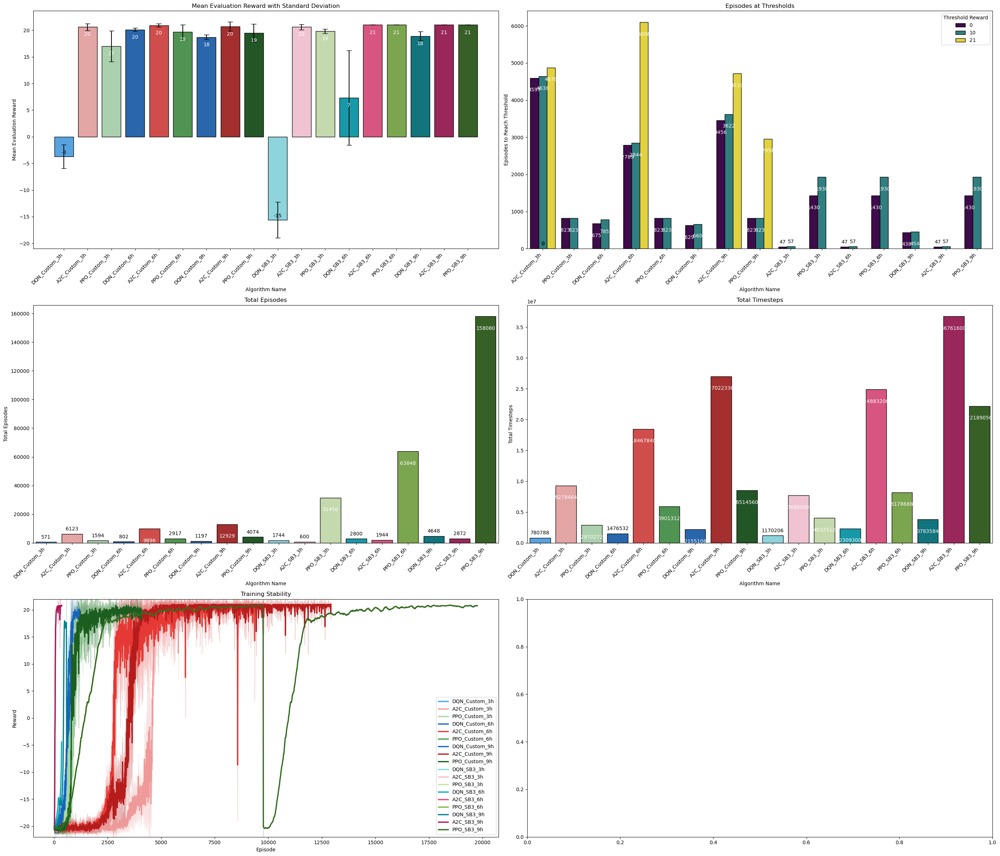

In [64]:
all_algorithms = data['Algorithm Name'].unique().tolist()
all_plots = [plot_mean_evaluation_rewards, plot_threshold_episodes, plot_total_episodes, plot_total_steps, plot_training_stability]
grid_dimensions = (3, 2)

plot_comparisons_in_grid(
    data,
    algorithms=all_algorithms,
    plot_functions=all_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

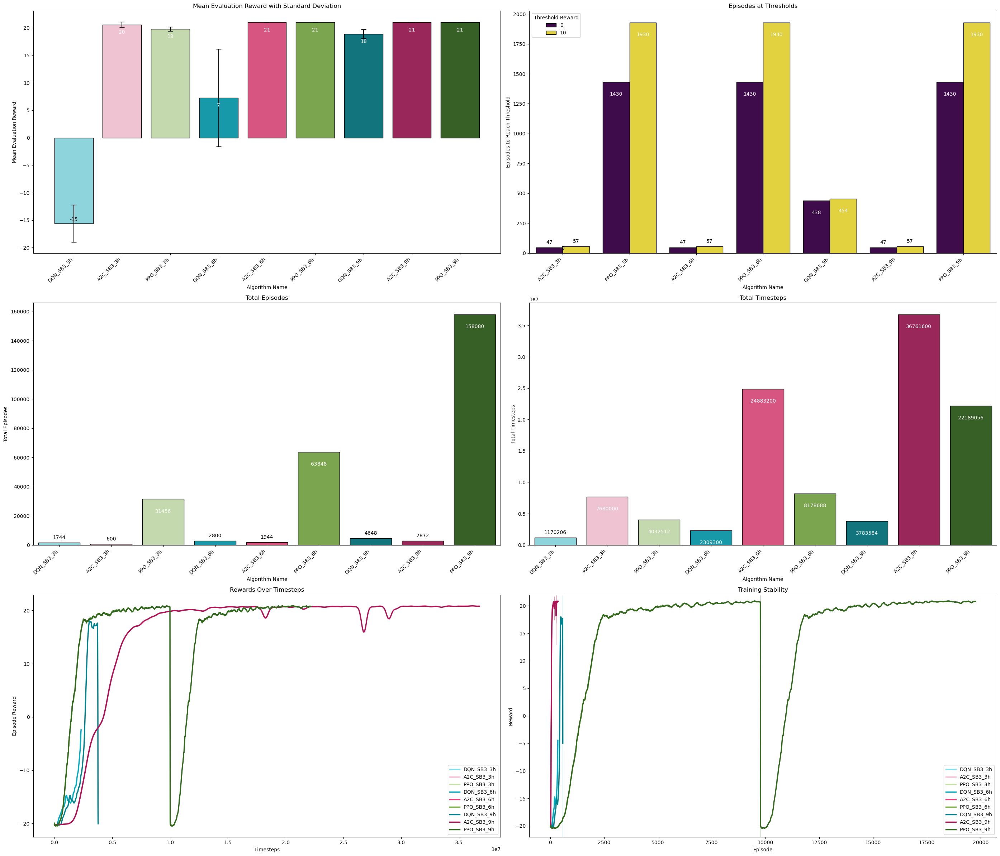

In [65]:
sb3_algorithms = [algo['name'] for algo in algorithms if algo['type'] == 'sb3']
sb3_plots = [plot_mean_evaluation_rewards, plot_threshold_episodes, plot_total_episodes, plot_total_steps, plot_rewards_over_time, plot_training_stability,]

plot_comparisons_in_grid(
    data,
    algorithms=sb3_algorithms,
    plot_functions=sb3_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

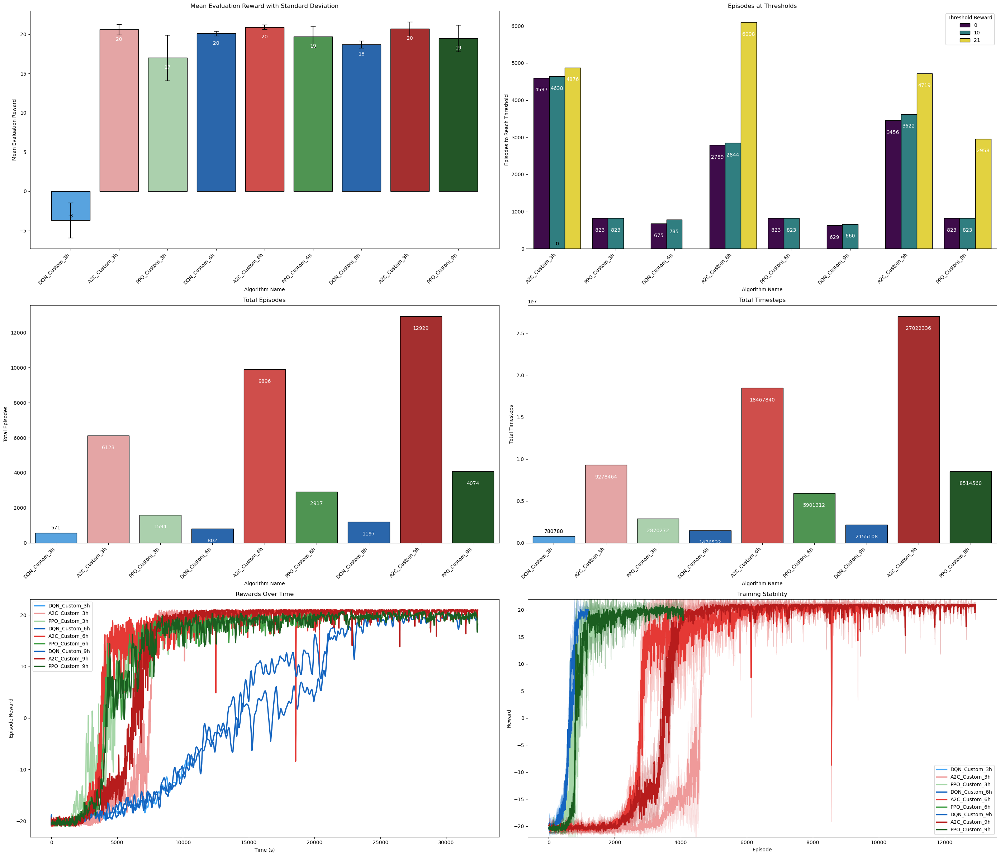

In [66]:
custom_algorithms = [algo['name'] for algo in algorithms if algo['type'] == 'custom']
custom_plots = [plot_mean_evaluation_rewards, plot_threshold_episodes, plot_total_episodes, plot_total_steps, plot_rewards_over_time, plot_training_stability]

plot_comparisons_in_grid(
    data,
    algorithms=custom_algorithms,
    plot_functions=custom_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

In [67]:
# Algorithms to compare
sb3_3h_algorithms = [algo['name'] for algo in algorithms if algo['type'] == 'sb3' and algo['duration'] == '3h']
sb3_6h_algorithms = [algo['name'] for algo in algorithms if algo['type'] == 'sb3' and algo['duration'] == '6h']
sb3_9h_algorithms = [algo['name'] for algo in algorithms if algo['type'] == 'sb3' and algo['duration'] == '9h']

custom_3h_algorithms = [algo['name'] for algo in algorithms if algo['type'] == 'custom' and algo['duration'] == '3h']
custom_6h_algorithms = [algo['name'] for algo in algorithms if algo['type'] == 'custom' and algo['duration'] == '6h']
custom_9h_algorithms = [algo['name'] for algo in algorithms if algo['type'] == 'custom' and algo['duration'] == '9h']

dqn_algorithms = [algo['name'] for algo in algorithms if 'DQN' in algo['name']]
a2c_algorithms = [algo['name'] for algo in algorithms if 'A2C' in algo['name']]
ppo_algorithms = [algo['name'] for algo in algorithms if 'PPO' in algo['name']]

dqn_3h_algorithms = [algo['name'] for algo in algorithms if 'DQN' in algo['name'] and algo['duration'] == '3h']
a2c_3h_algorithms = [algo['name'] for algo in algorithms if 'A2C' in algo['name'] and algo['duration'] == '3h']
ppo_3h_algorithms = [algo['name'] for algo in algorithms if 'PPO' in algo['name'] and algo['duration'] == '3h']

dqn_6h_algorithms = [algo['name'] for algo in algorithms if 'DQN' in algo['name'] and algo['duration'] == '6h']
a2c_6h_algorithms = [algo['name'] for algo in algorithms if 'A2C' in algo['name'] and algo['duration'] == '6h']
ppo_6h_algorithms = [algo['name'] for algo in algorithms if 'PPO' in algo['name'] and algo['duration'] == '6h']

dqn_9h_algorithms = [algo['name'] for algo in algorithms if 'DQN' in algo['name'] and algo['duration'] == '9h']
a2c_9h_algorithms = [algo['name'] for algo in algorithms if 'A2C' in algo['name'] and algo['duration'] == '9h']
ppo_9h_algorithms = [algo['name'] for algo in algorithms if 'PPO' in algo['name'] and algo['duration'] == '9h']


# Plots
sb3_algorithm_plots = [plot_mean_evaluation_rewards, plot_threshold_episodes, plot_total_episodes, plot_total_steps, plot_rewards_over_time, plot_training_stability]
custom_algorithm_plots = [plot_mean_evaluation_rewards, plot_threshold_episodes, plot_total_episodes, plot_total_steps, plot_rewards_over_time, plot_training_stability]
mixed_plots = [plot_mean_evaluation_rewards, plot_threshold_episodes, plot_total_episodes, plot_total_steps, plot_training_stability]


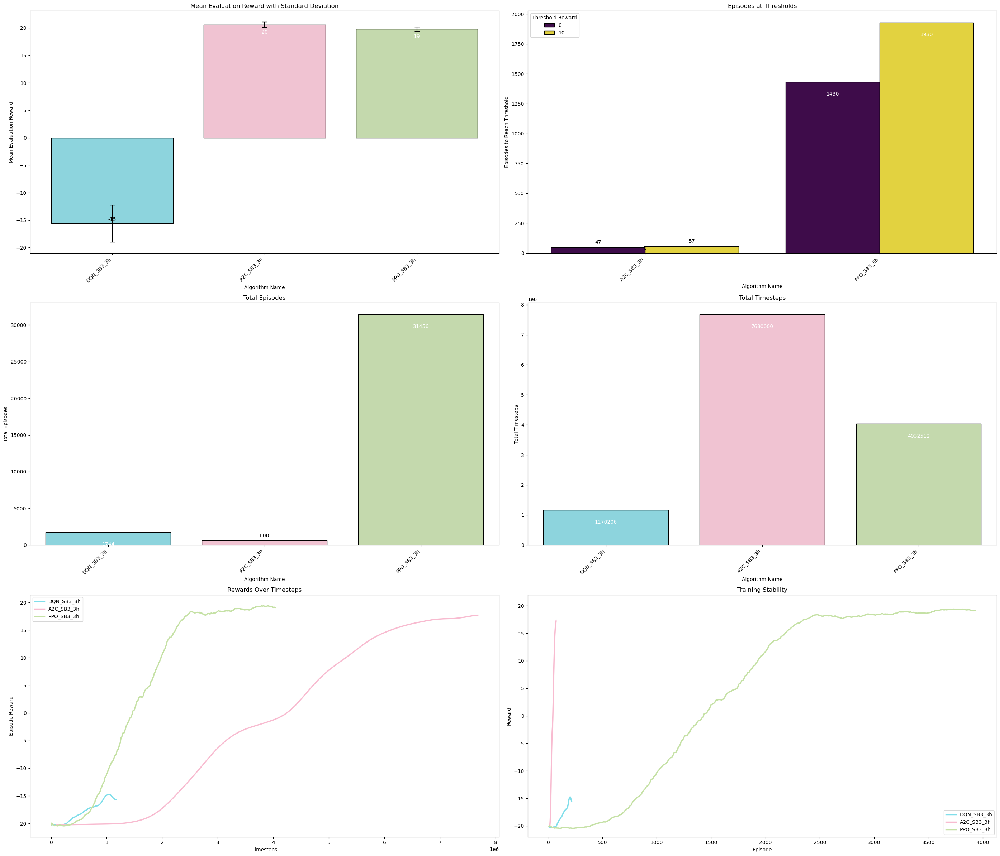

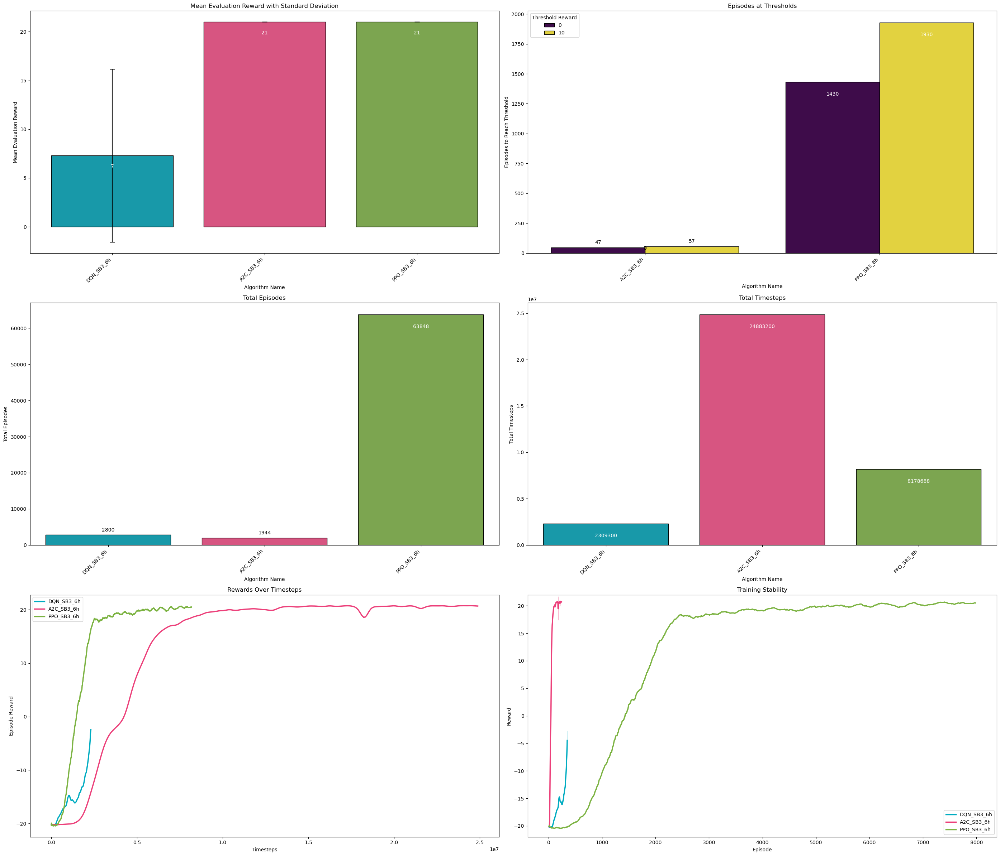

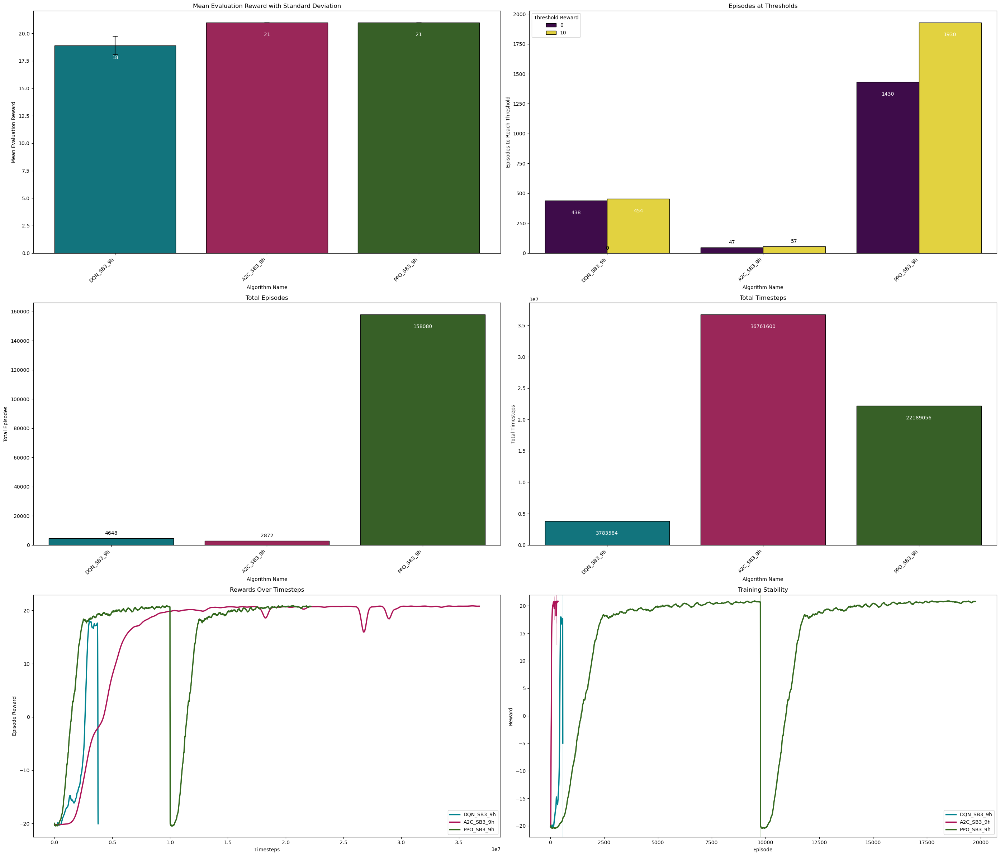

In [68]:
# SB3 Algorithms
plot_comparisons_in_grid(
    data,
    algorithms=sb3_3h_algorithms,
    plot_functions=sb3_algorithm_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=sb3_6h_algorithms,
    plot_functions=sb3_algorithm_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=sb3_9h_algorithms,
    plot_functions=sb3_algorithm_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

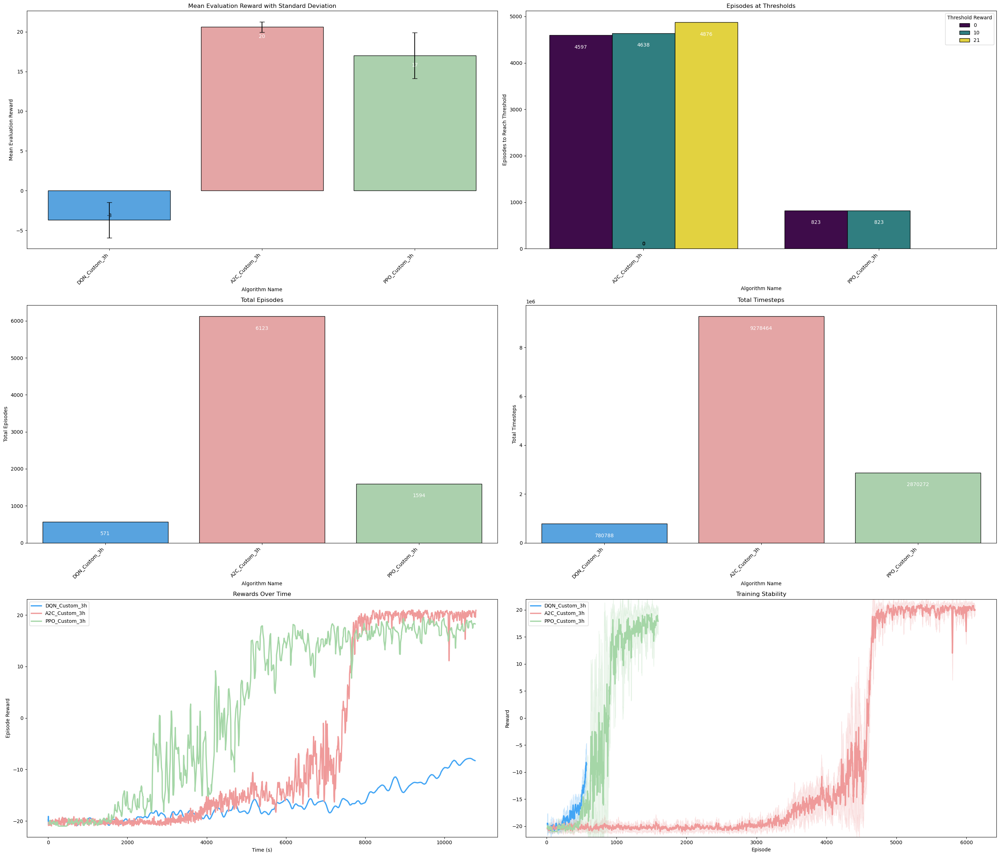

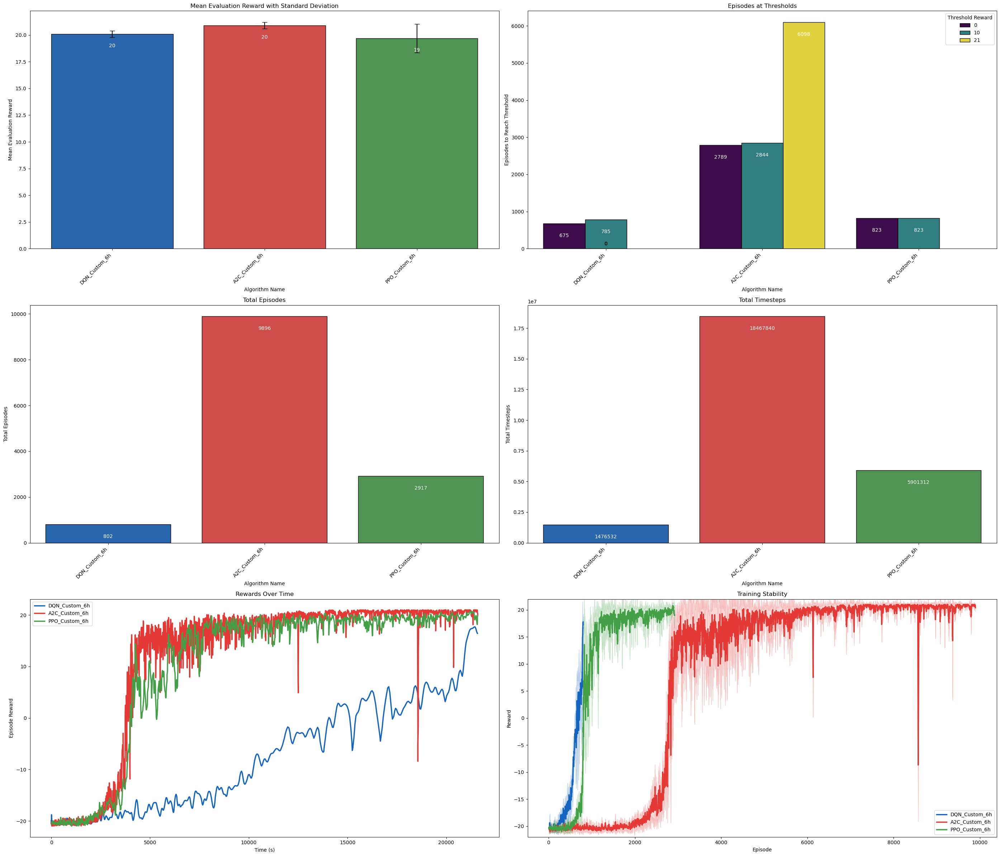

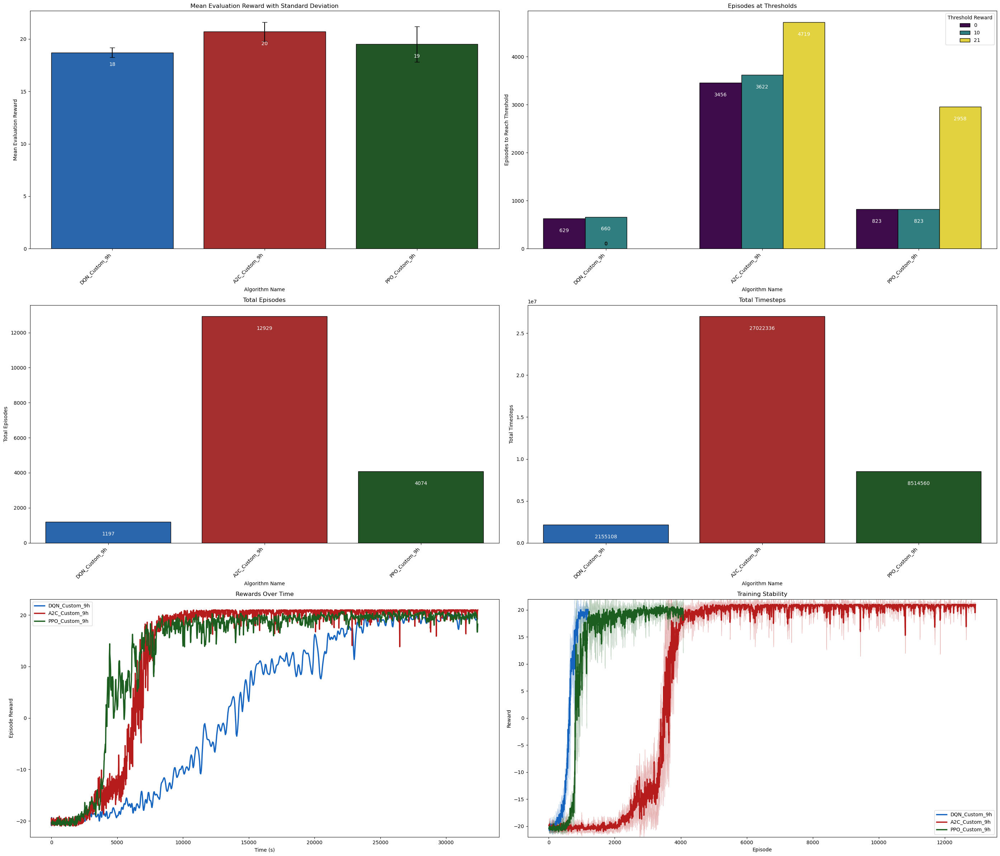

In [69]:
# Custom Algorithms
plot_comparisons_in_grid(
    data,
    algorithms=custom_3h_algorithms,
    plot_functions=custom_algorithm_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=custom_6h_algorithms,
    plot_functions=custom_algorithm_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=custom_9h_algorithms,
    plot_functions=custom_algorithm_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

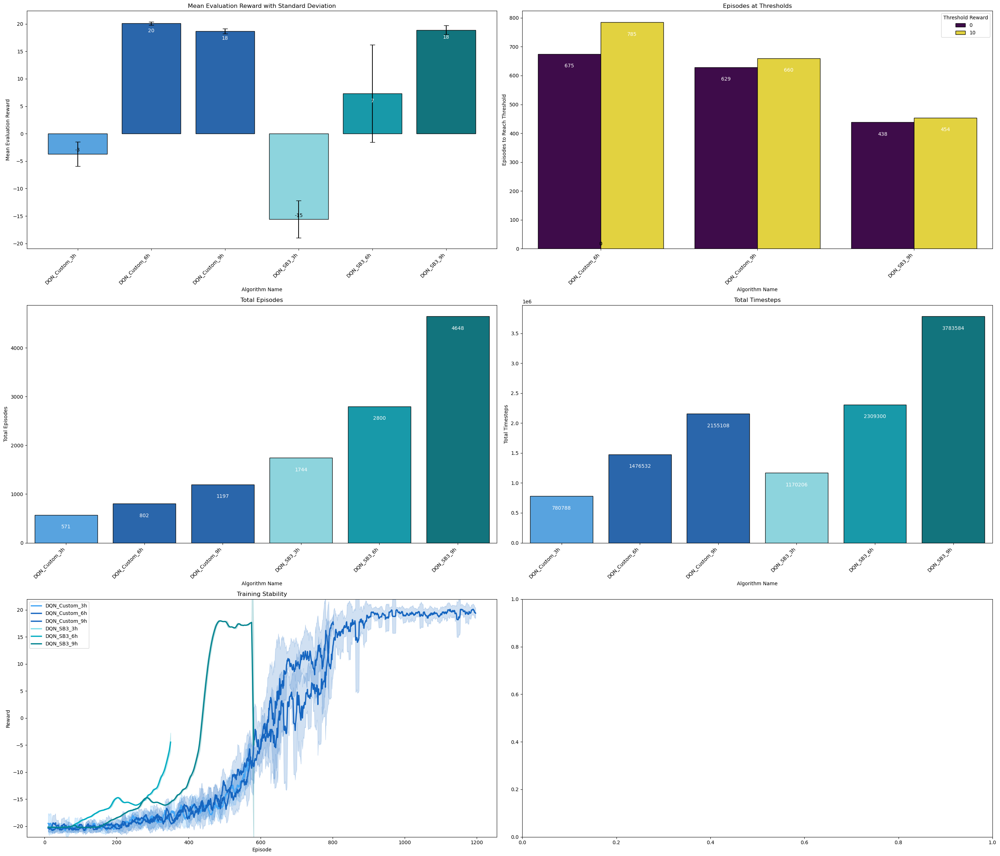

No threshold data available.


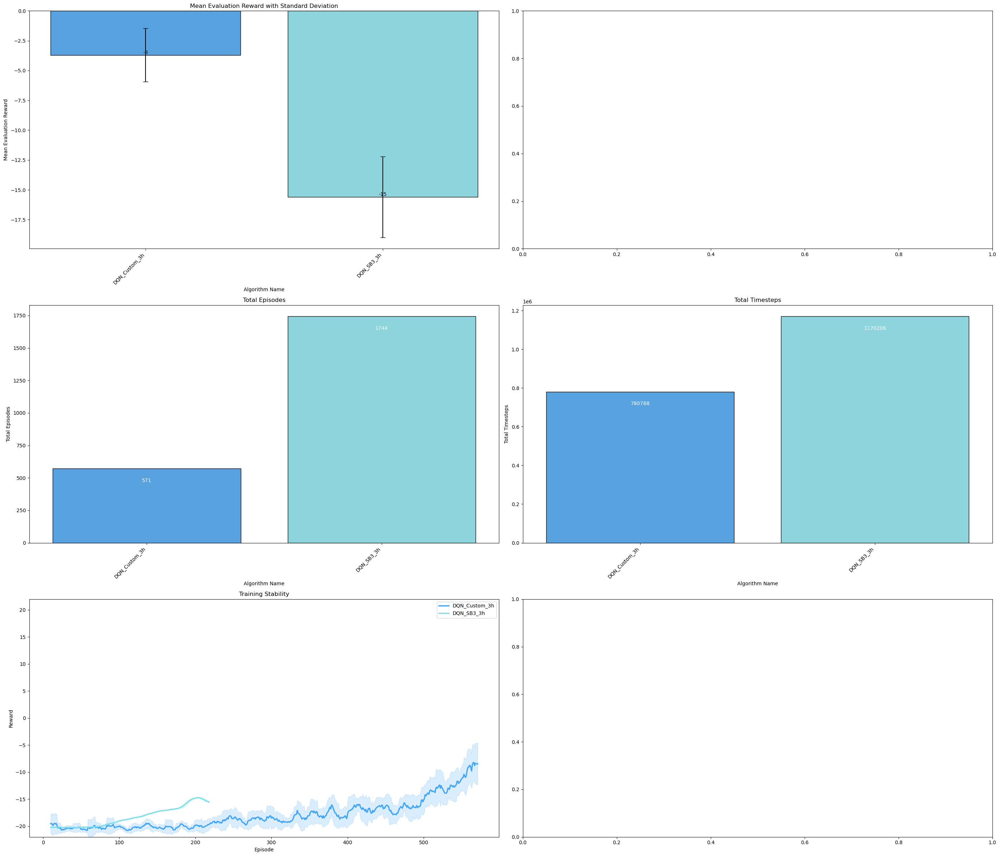

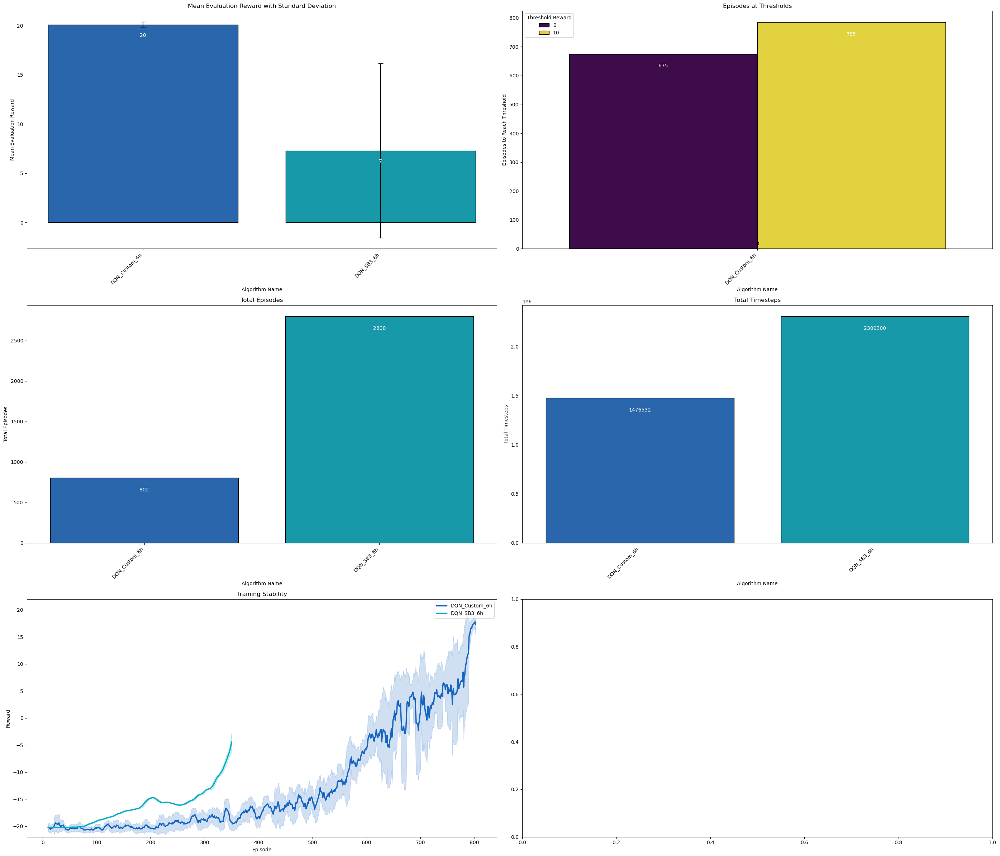

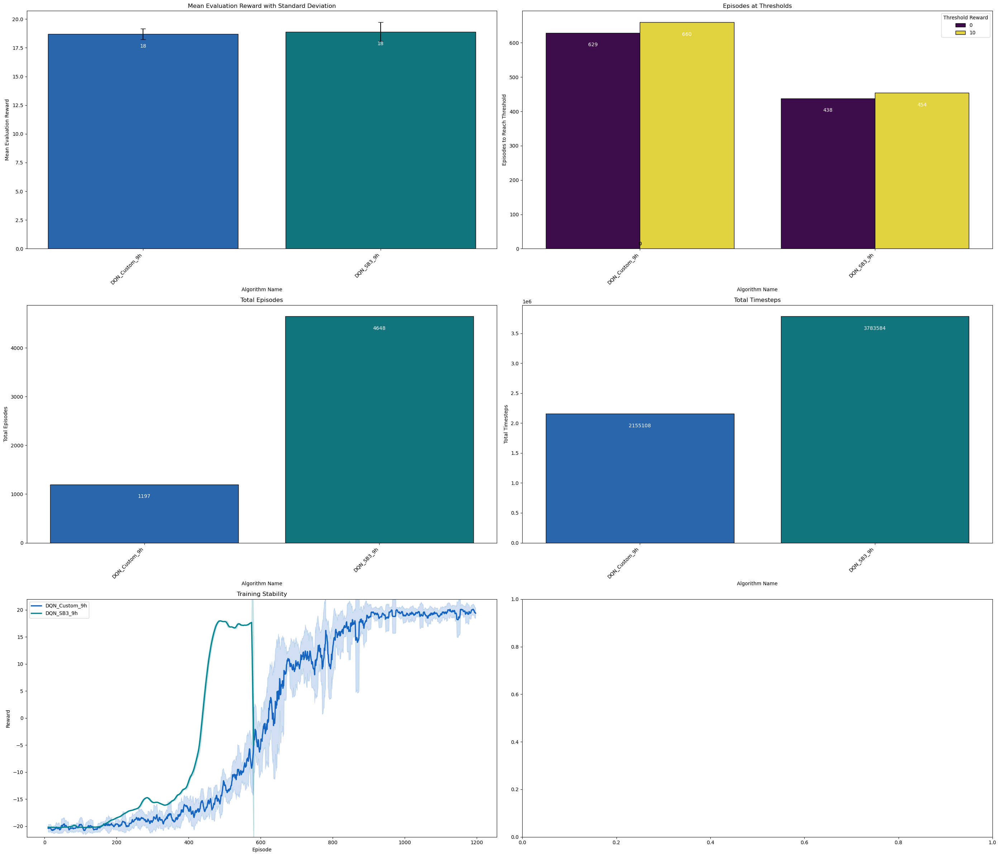

In [70]:
# DQN Algorithms
plot_comparisons_in_grid(
    data,
    algorithms=dqn_algorithms,
    plot_functions=mixed_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=dqn_3h_algorithms,
    plot_functions=mixed_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=dqn_6h_algorithms,
    plot_functions=mixed_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=dqn_9h_algorithms,
    plot_functions=mixed_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

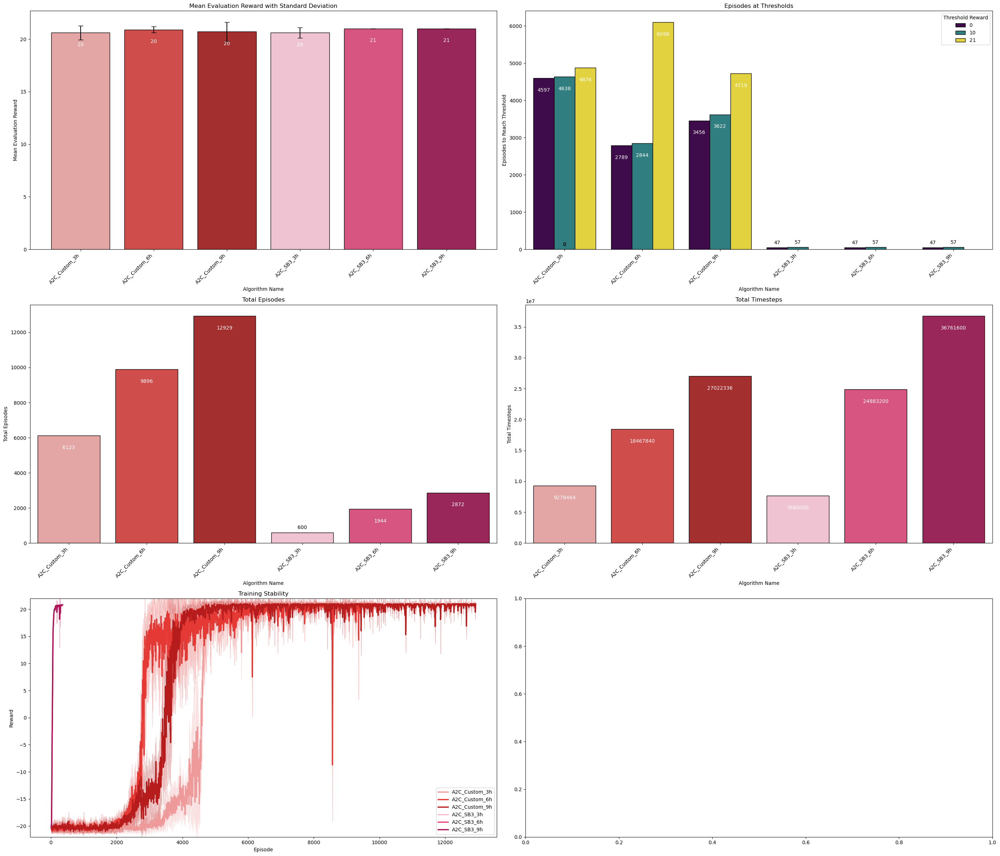

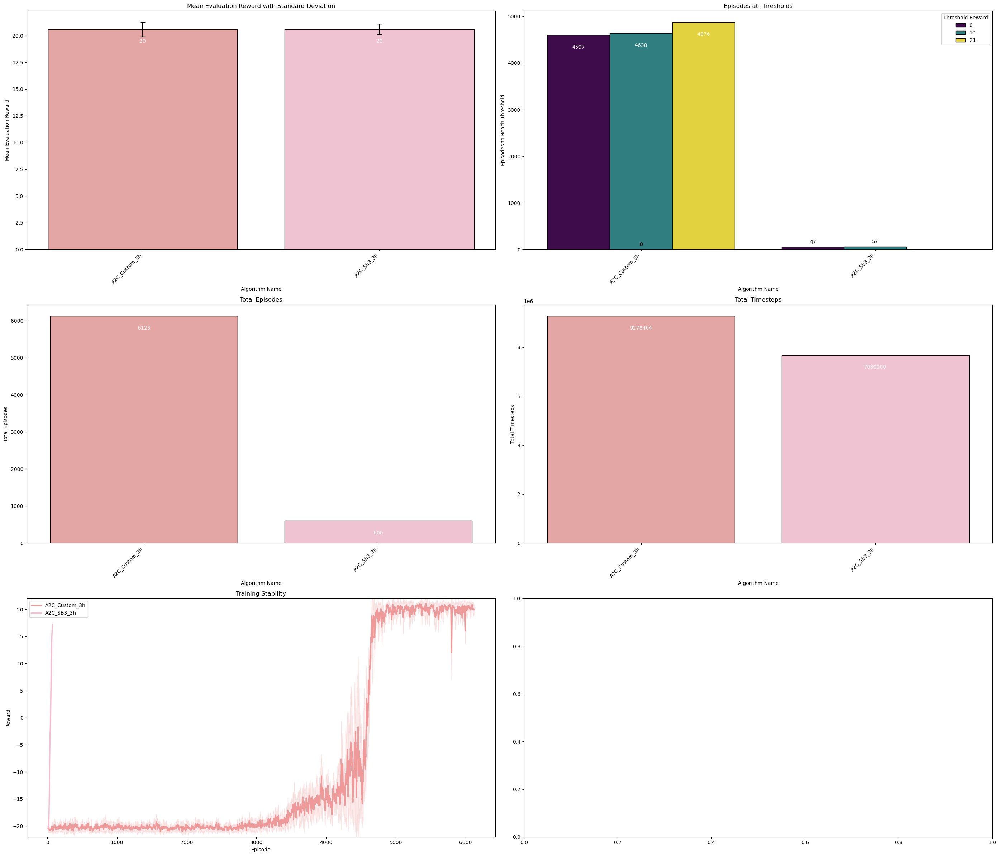

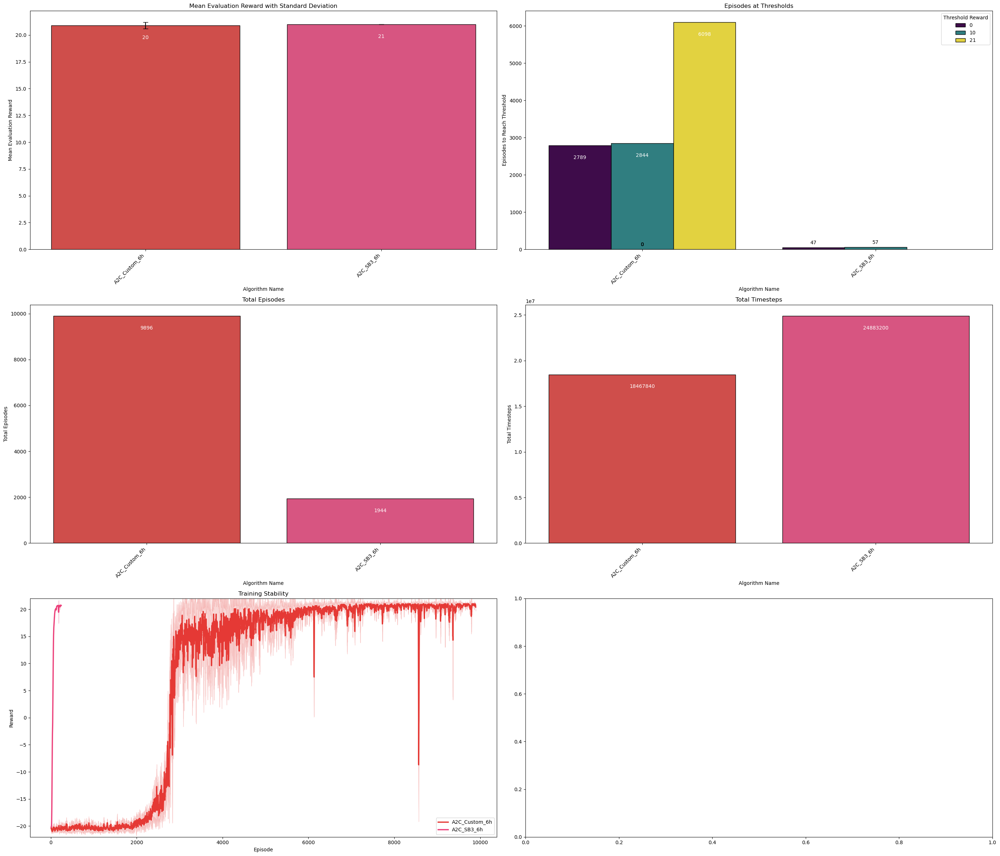

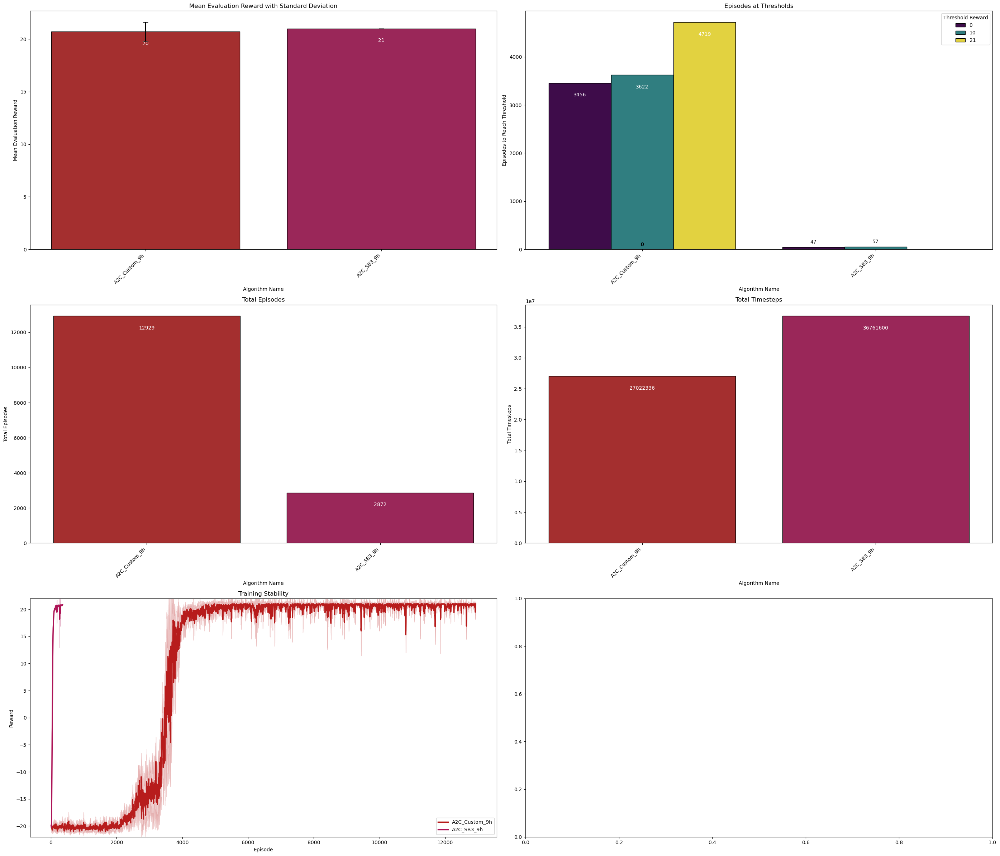

In [71]:
# A2C Algorithms
plot_comparisons_in_grid(
    data,
    algorithms=a2c_algorithms,
    plot_functions=mixed_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=a2c_3h_algorithms,
    plot_functions=mixed_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=a2c_6h_algorithms,
    plot_functions=mixed_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=a2c_9h_algorithms,
    plot_functions=mixed_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

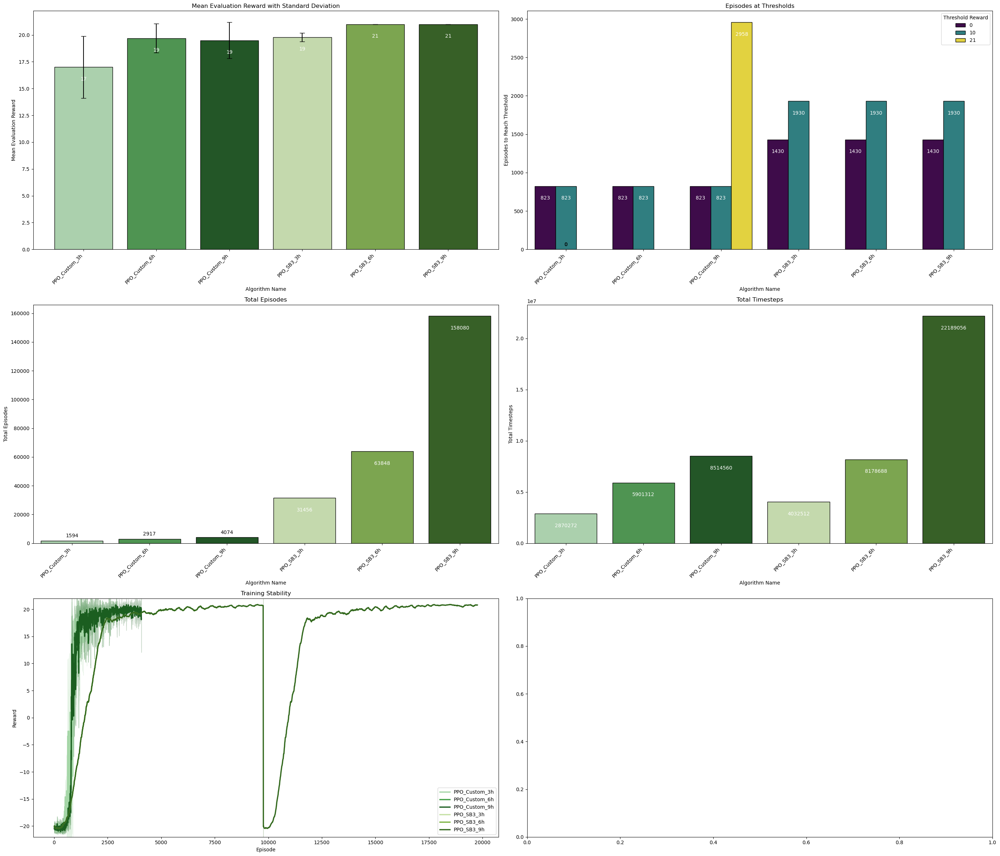

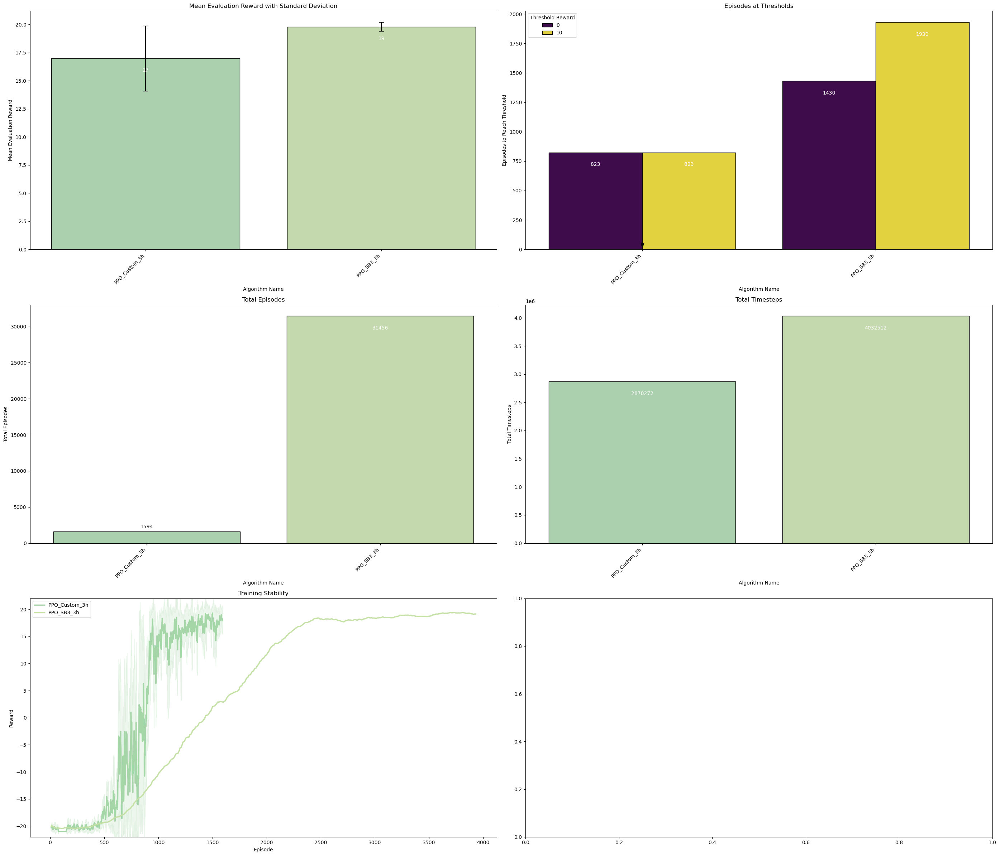

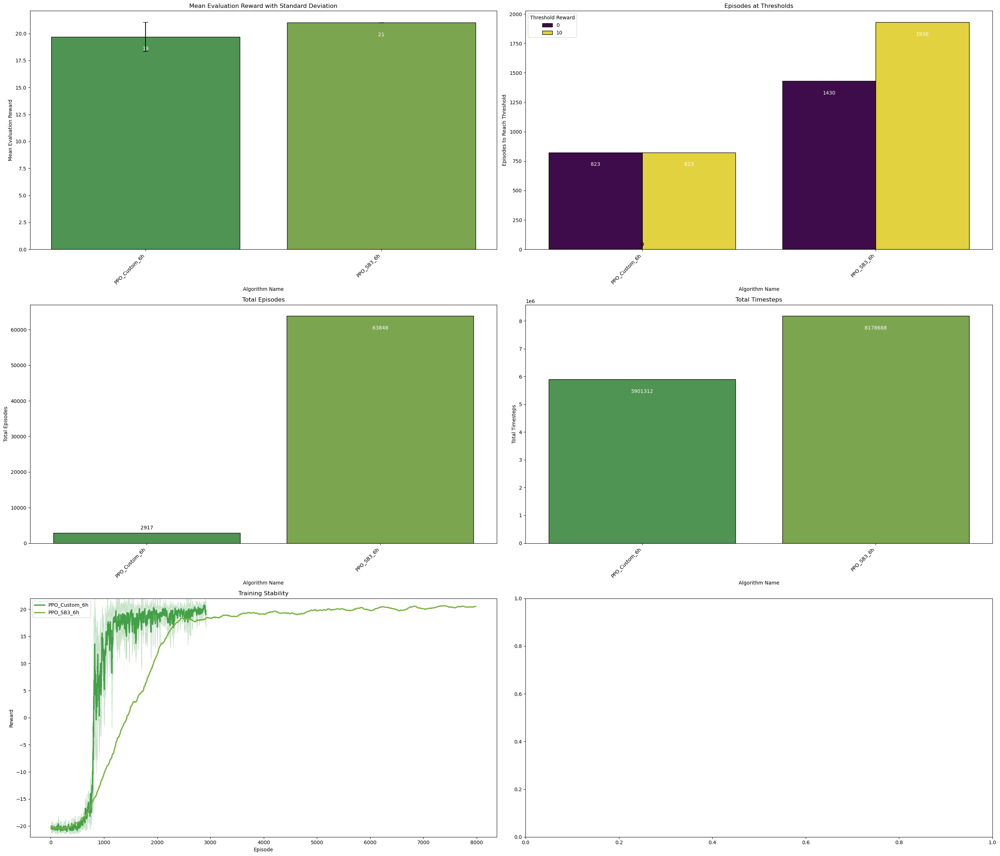

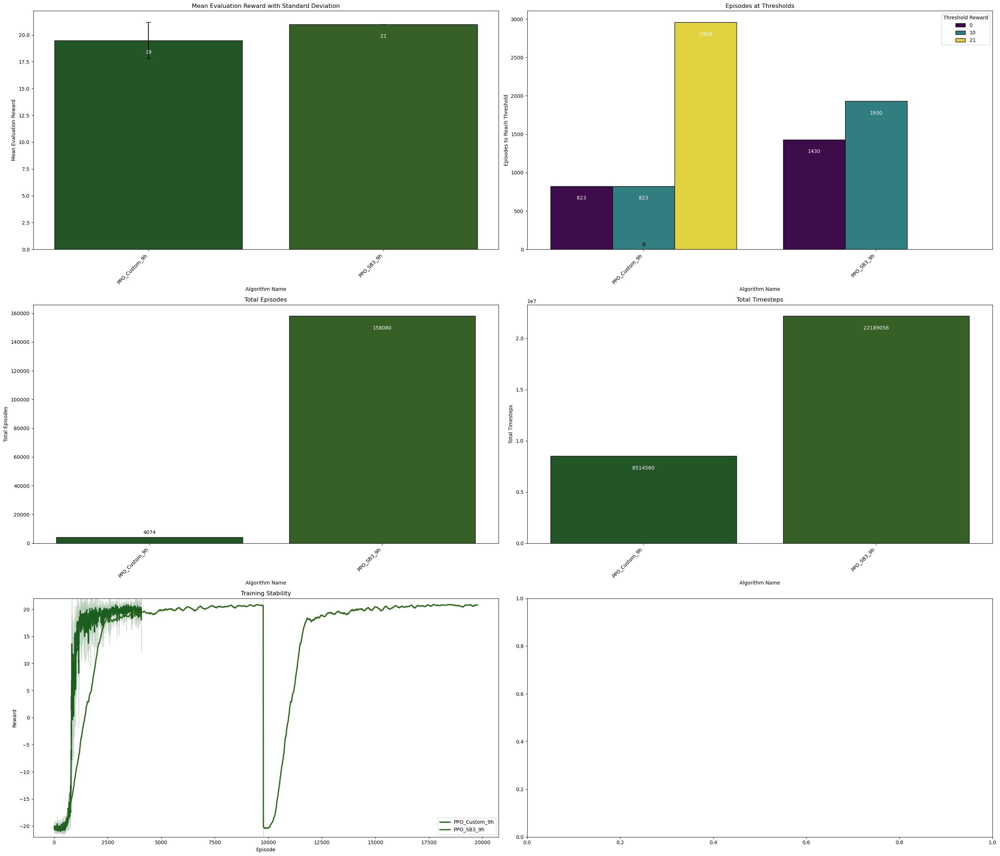

In [72]:
# PPO Algorithms
plot_comparisons_in_grid(
    data,
    algorithms=ppo_algorithms,
    plot_functions=mixed_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=ppo_3h_algorithms,
    plot_functions=mixed_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=ppo_6h_algorithms,
    plot_functions=mixed_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=ppo_9h_algorithms,
    plot_functions=mixed_plots,
    grid_size=grid_dimensions,
    thresholds=[0, 10, 21],
    sigma=2
)

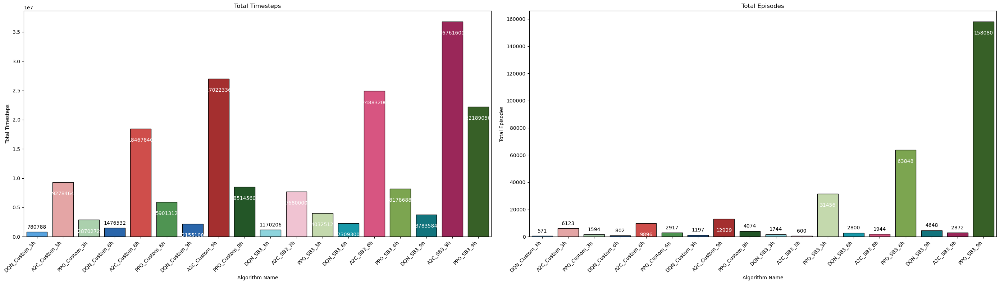

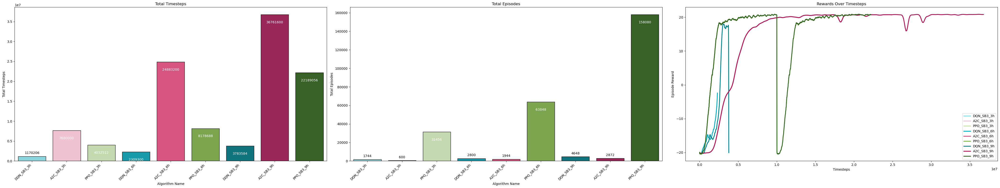

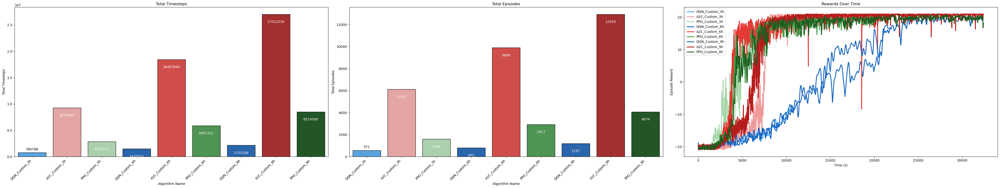

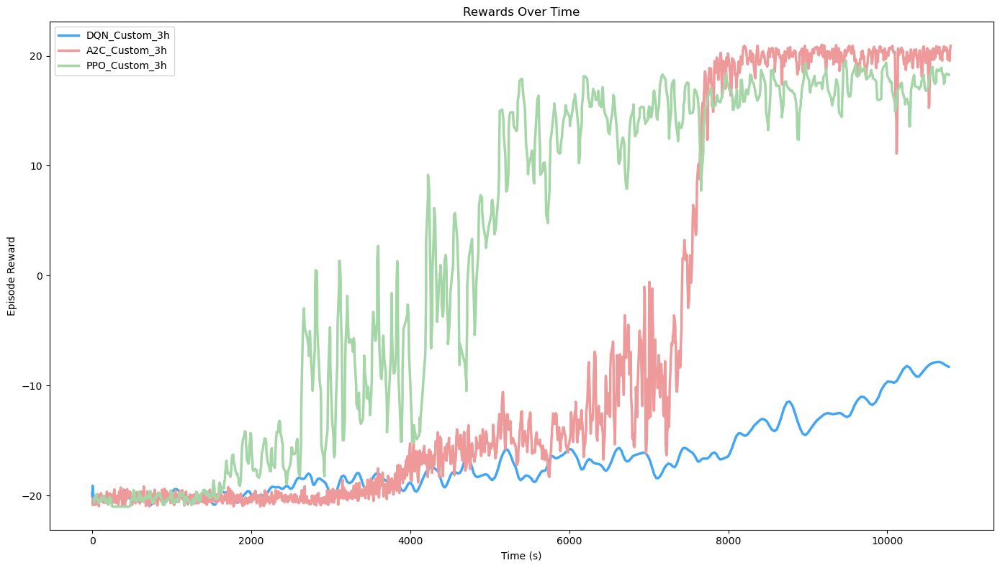

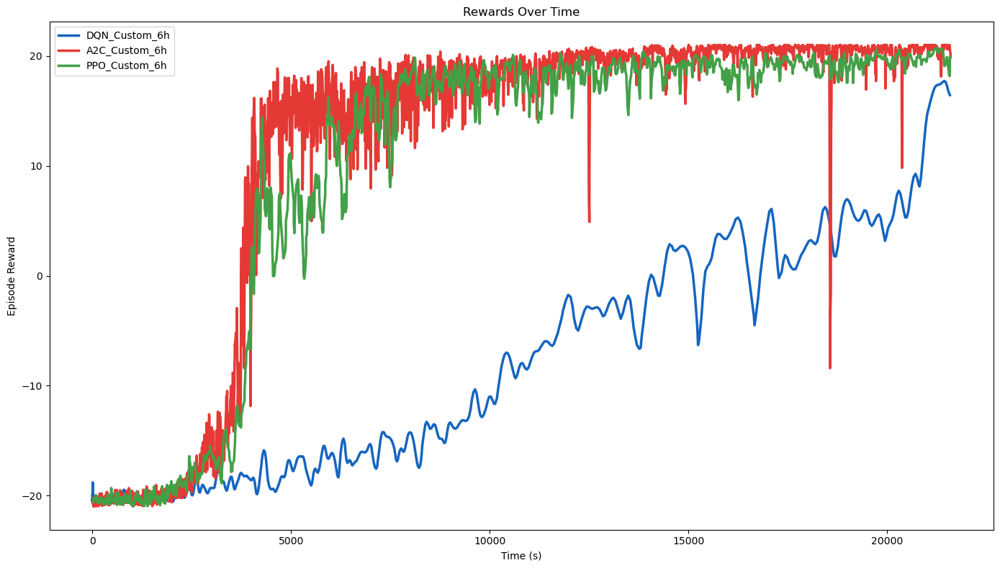

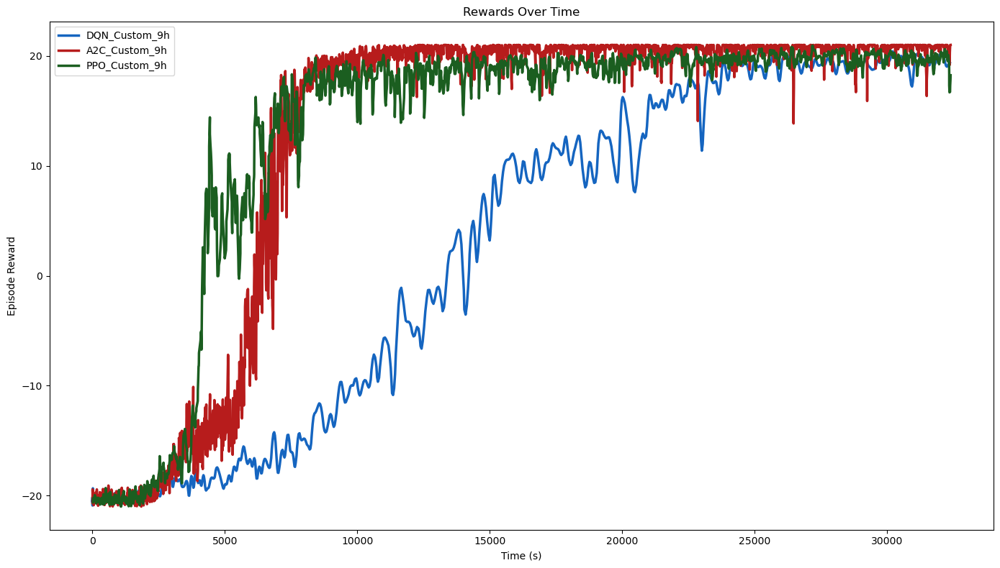

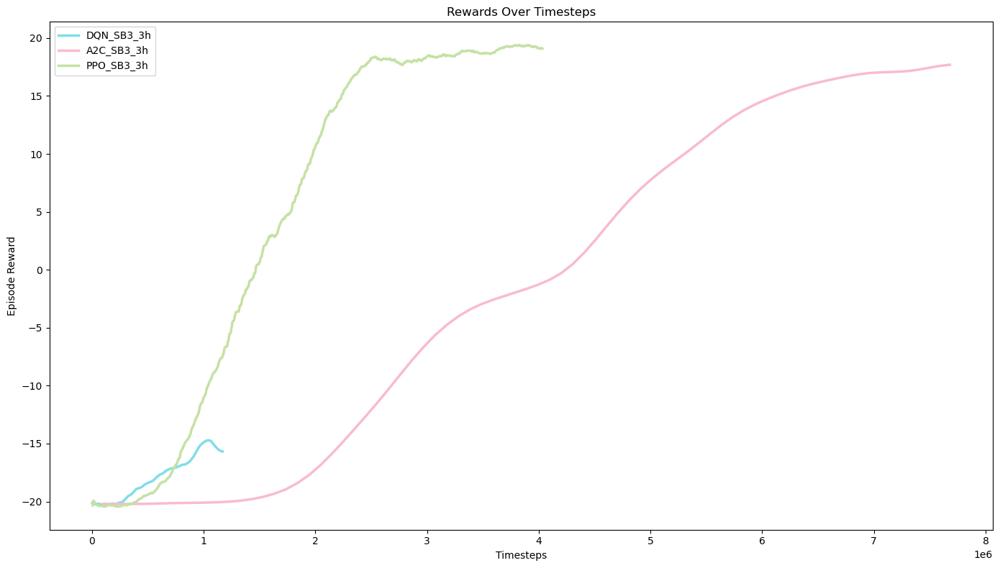

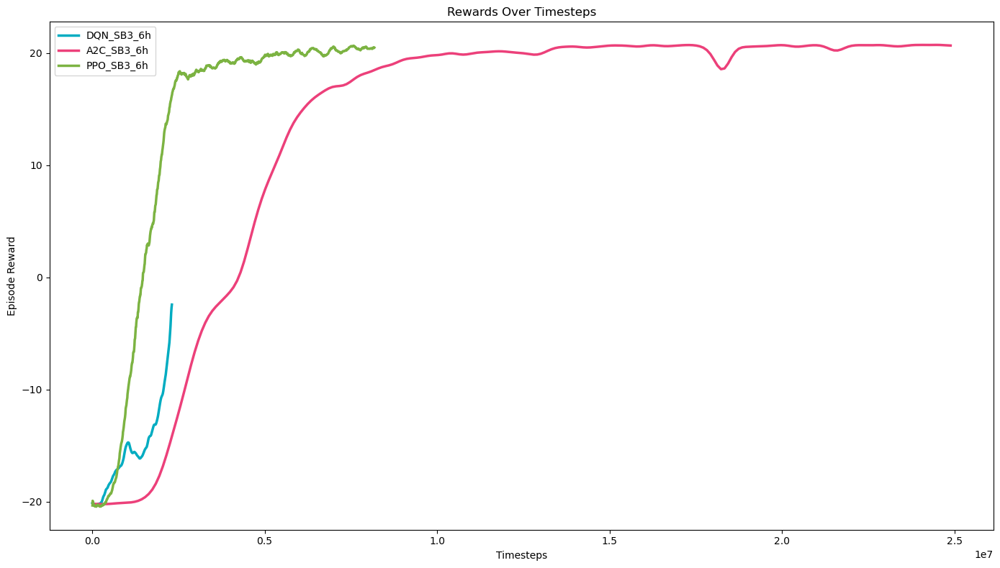

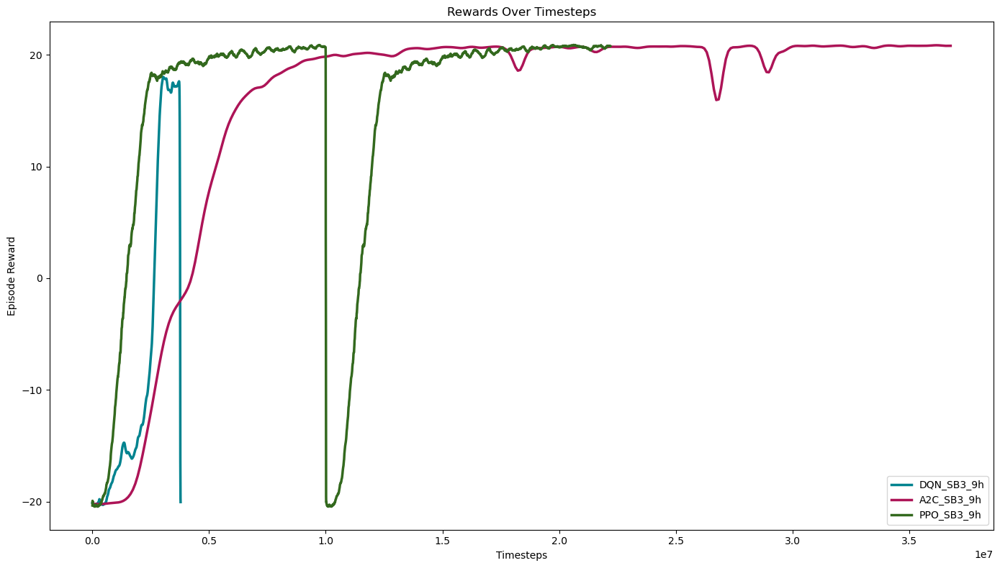

In [73]:
# Training progress of all algorithms
training_progress_plots = [plot_total_steps, plot_total_episodes, plot_rewards_over_time]
plot_comparisons_in_grid(
    data,
    algorithms=all_algorithms,
    plot_functions=[plot_total_steps, plot_total_episodes],
    grid_size=(1, 2),
    thresholds=[0, 10, 21],
    sigma=2
)

# training progress of SB3 algorithms
plot_comparisons_in_grid(
    data,
    algorithms=sb3_algorithms,
    plot_functions=training_progress_plots,
    grid_size=(1, 3),
    thresholds=[0, 10, 21],
    sigma=2
)

# training progress of Custom algorithms
plot_comparisons_in_grid(
    data,
    algorithms=custom_algorithms,
    plot_functions=training_progress_plots,
    grid_size=(1, 3),
    thresholds=[0, 10, 21],
    sigma=2
)

# Plot the 3h, 6h, and 9h functions for custom algorithms for rewards over time in separate plots
plot_comparisons_in_grid(
    data,
    algorithms=custom_3h_algorithms,
    plot_functions=[plot_rewards_over_time],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=custom_6h_algorithms,
    plot_functions=[plot_rewards_over_time],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=custom_9h_algorithms,
    plot_functions=[plot_rewards_over_time],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

# Plot the 3h, 6h, and 9h functions for SB3 algorithms for rewards over time in separate plots
plot_comparisons_in_grid(
    data,
    algorithms=sb3_3h_algorithms,
    plot_functions=[plot_rewards_over_time],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=sb3_6h_algorithms,
    plot_functions=[plot_rewards_over_time],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=sb3_9h_algorithms,
    plot_functions=[plot_rewards_over_time],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)


In [74]:
# Select relevant columns for the summary table
timesteps_summary_columns = [
    'Algorithm Name', 
    'Total Steps',
    'Total Episodes',
    'Average Timesteps per Episode',
]

# Create a summary DataFrame
timesteps_summary_df = data[timesteps_summary_columns].copy()

# Round the numbers to 2 decimal places
timesteps_summary_df['Total Steps'] = timesteps_summary_df['Total Steps'].round(2)

# Handle missing data by replacing NaN with 'N/A'
timesteps_summary_df = timesteps_summary_df.fillna('N/A')

# Transpose the DataFrame to flip the table

# Display the summary table
display(timesteps_summary_df)


,Algorithm Name,Total Steps,Total Episodes,Average Timesteps per Episode
0,DQN_Custom_3h,780788.0,571,1367.404553
1,A2C_Custom_3h,9278464.0,6123,1515.346072
2,PPO_Custom_3h,2870272.0,1594,1800.672522
3,DQN_Custom_6h,1476532.0,802,1841.062344
4,A2C_Custom_6h,18467840.0,9896,1866.192401
5,PPO_Custom_6h,5901312.0,2917,2023.075763
6,DQN_Custom_9h,2155108.0,1197,1800.424394
7,A2C_Custom_9h,27022336.0,12929,2090.056153
8,PPO_Custom_9h,8514560.0,4074,2089.975454
9,DQN_SB3_3h,1170206.0,1744,5375.774194


In [75]:
# Select relevant columns for the summary table
episodes_summary_columns = [
    'Algorithm Name', 
    'Total Episodes'
]

# Create a summary DataFrame
episodes_summary_df = data[episodes_summary_columns].copy()

# Handle missing data by replacing NaN with 'N/A'
episodes_summary_df = episodes_summary_df.fillna('N/A')

# Display the summary table
display(episodes_summary_df)

,Algorithm Name,Total Episodes
0,DQN_Custom_3h,571
1,A2C_Custom_3h,6123
2,PPO_Custom_3h,1594
3,DQN_Custom_6h,802
4,A2C_Custom_6h,9896
5,PPO_Custom_6h,2917
6,DQN_Custom_9h,1197
7,A2C_Custom_9h,12929
8,PPO_Custom_9h,4074
9,DQN_SB3_3h,1744


In [76]:
# Select relevant columns for the convergence speed summary table
convergence_speed_columns = [
    'Algorithm Name', 
    'Threshold Episode'
]

# Create a summary DataFrame
convergence_speed_df = data[convergence_speed_columns].copy()

# Format the threshold columns for better readability
convergence_speed_df['Threshold Episode'] = convergence_speed_df['Threshold Episode'].apply(format_threshold_dict)

# Handle missing data by replacing NaN with 'N/A'
convergence_speed_df = convergence_speed_df.fillna('N/A')

# Display the summary table
display(convergence_speed_df)

,Algorithm Name,Threshold Episode
0,DQN_Custom_3h,N/A
1,A2C_Custom_3h,"0: 4597, 10: 4638, 21: 4876"
2,PPO_Custom_3h,"0: 823, 10: 823"
3,DQN_Custom_6h,"0: 675, 10: 785"
4,A2C_Custom_6h,"0: 2789, 10: 2844, 21: 6098"
5,PPO_Custom_6h,"0: 823, 10: 823"
6,DQN_Custom_9h,"0: 629, 10: 660"
7,A2C_Custom_9h,"0: 3456, 10: 3622, 21: 4719"
8,PPO_Custom_9h,"0: 823, 10: 823, 21: 2958"
9,DQN_SB3_3h,N/A


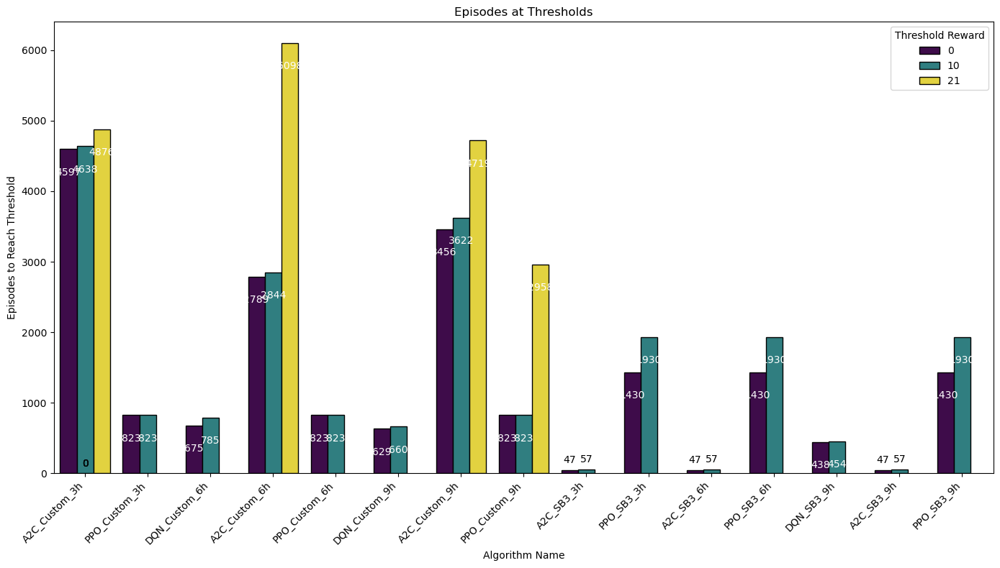

In [77]:
# Visualize the threshold episodes for all algorithms
plot_comparisons_in_grid(
    data,
    algorithms=all_algorithms,
    plot_functions=[plot_threshold_episodes],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

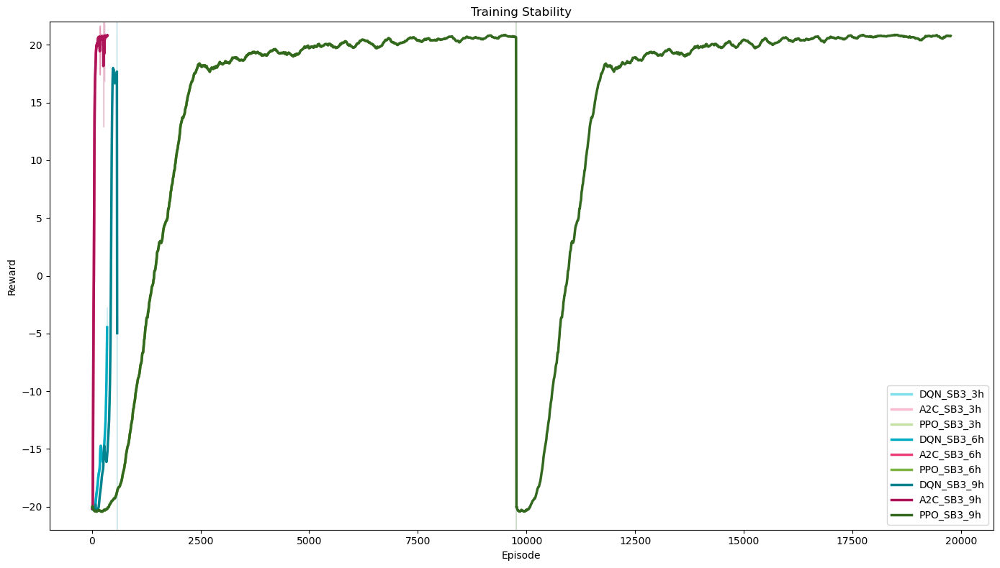

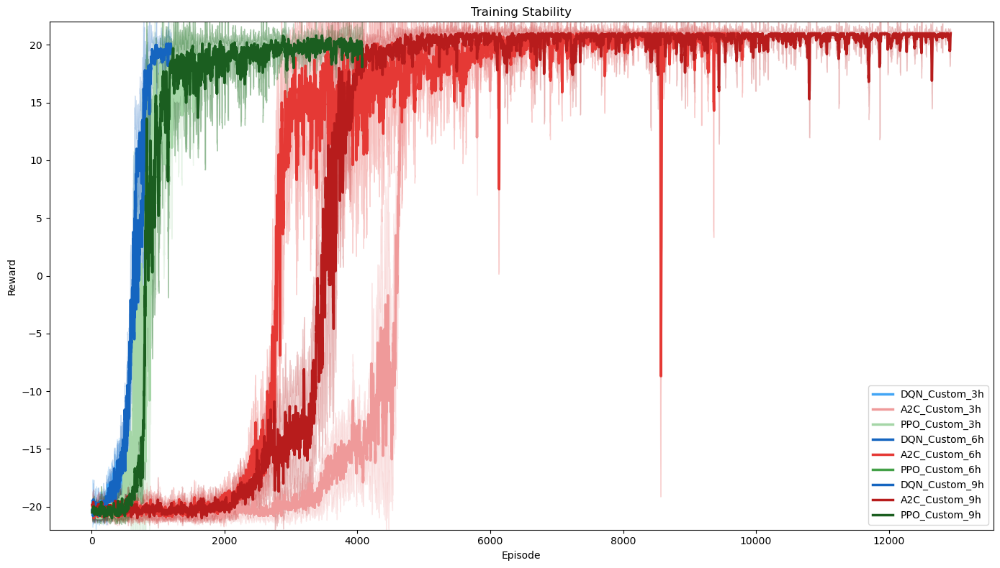

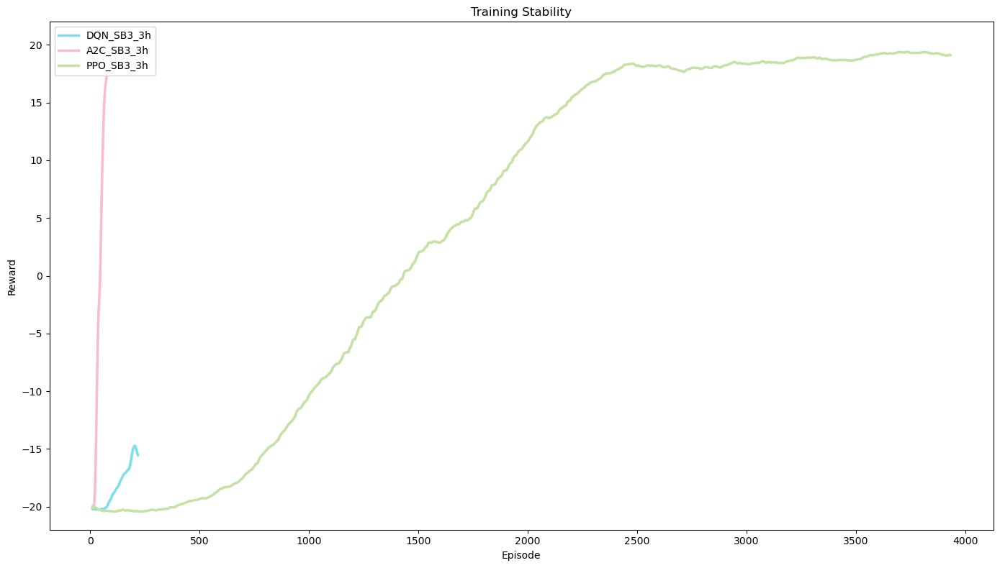

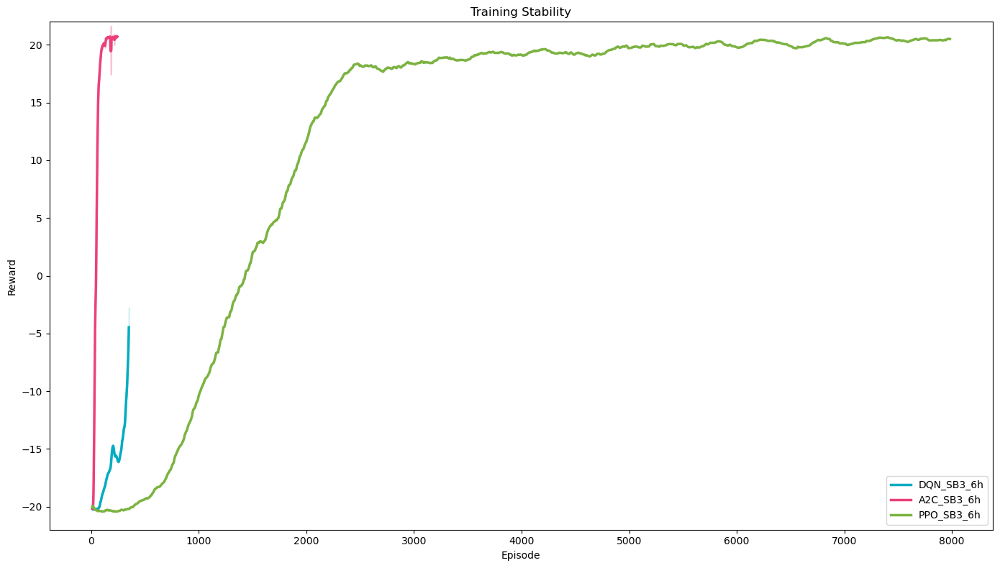

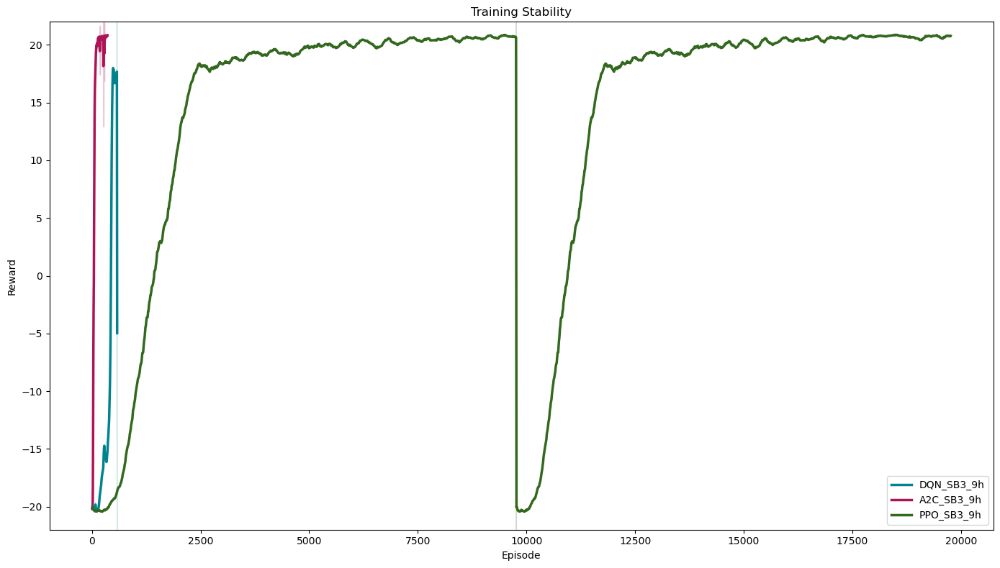

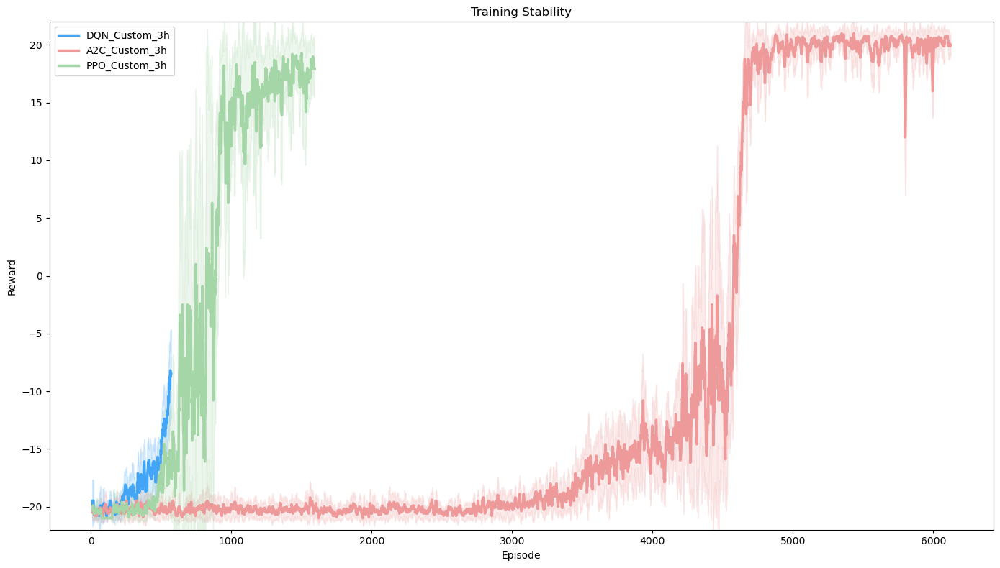

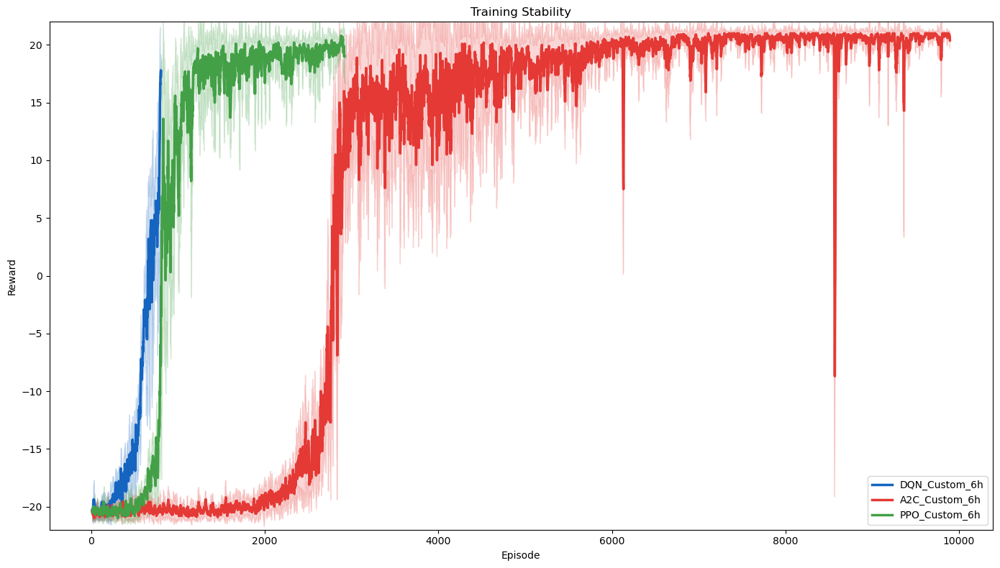

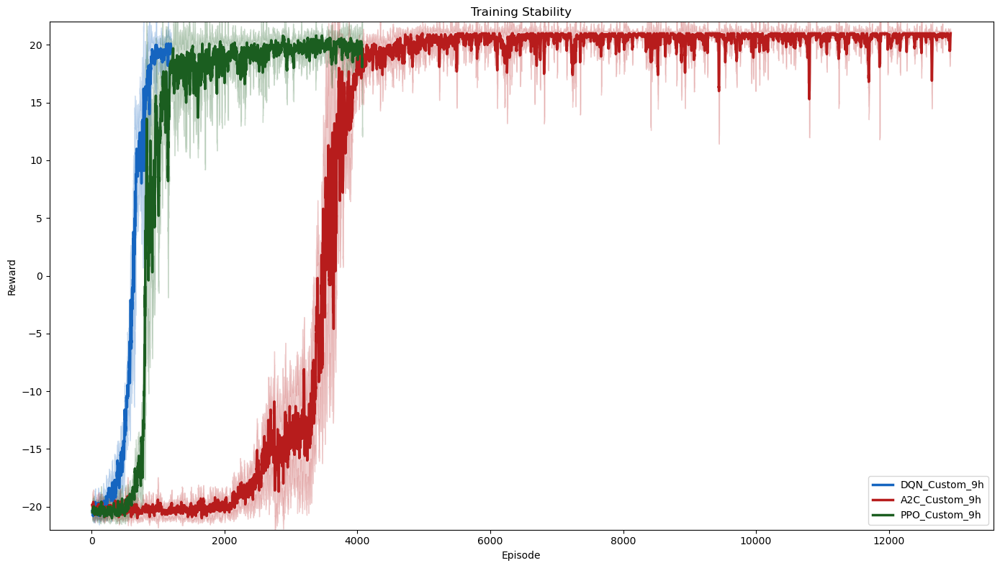

In [78]:
# Visualize training stability for all SB3 and Custom algorithms in one row
plot_comparisons_in_grid(
    data,
    algorithms=sb3_algorithms,
    plot_functions=[plot_training_stability],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=custom_algorithms,
    plot_functions=[plot_training_stability],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

# Visualize training stability split by hours and algorithm
# SB3 Algorithms
plot_comparisons_in_grid(
    data,
    algorithms=sb3_3h_algorithms,
    plot_functions=[plot_training_stability],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=sb3_6h_algorithms,
    plot_functions=[plot_training_stability],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=sb3_9h_algorithms,
    plot_functions=[plot_training_stability],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

# Custom Algorithms
plot_comparisons_in_grid(
    data,
    algorithms=custom_3h_algorithms,
    plot_functions=[plot_training_stability],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=custom_6h_algorithms,
    plot_functions=[plot_training_stability],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

plot_comparisons_in_grid(
    data,
    algorithms=custom_9h_algorithms,
    plot_functions=[plot_training_stability],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

In [79]:
# Select relevant columns for the training stability summary table#
training_stability_columns = [
    'Algorithm Name', 
    'Total Episodes', 
    'Average Timesteps per Episode'
]

# Create a summary DataFrame
training_stability_df = data[training_stability_columns].copy()

# Handle missing data by replacing NaN with 'N/A'
training_stability_df = training_stability_df.fillna('N/A')

# Display the summary table
display(training_stability_df)

,Algorithm Name,Total Episodes,Average Timesteps per Episode
0,DQN_Custom_3h,571,1367.404553
1,A2C_Custom_3h,6123,1515.346072
2,PPO_Custom_3h,1594,1800.672522
3,DQN_Custom_6h,802,1841.062344
4,A2C_Custom_6h,9896,1866.192401
5,PPO_Custom_6h,2917,2023.075763
6,DQN_Custom_9h,1197,1800.424394
7,A2C_Custom_9h,12929,2090.056153
8,PPO_Custom_9h,4074,2089.975454
9,DQN_SB3_3h,1744,5375.774194


In [80]:
# Select relevant columns for the evaluation environment summary table
evaluation_env_columns = [
    'Algorithm Name', 
    'Mean Evaluation Reward', 
    'Std Evaluation Reward'
]

# Create a summary DataFrame
evaluation_env_df = data[evaluation_env_columns].copy()

# Handle missing data by replacing NaN with 'N/A'
evaluation_env_df = evaluation_env_df.fillna('N/A')

# Display the summary table
display(evaluation_env_df)

,Algorithm Name,Mean Evaluation Reward,Std Evaluation Reward
0,DQN_Custom_3h,-3.7,2.238303
1,A2C_Custom_3h,20.6,0.663325
2,PPO_Custom_3h,17.0,2.898275
3,DQN_Custom_6h,20.1,0.300000
4,A2C_Custom_6h,20.9,0.300000
5,PPO_Custom_6h,19.7,1.345362
6,DQN_Custom_9h,18.7,0.458258
7,A2C_Custom_9h,20.7,0.900000
8,PPO_Custom_9h,19.5,1.688194
9,DQN_SB3_3h,-15.6,3.382307


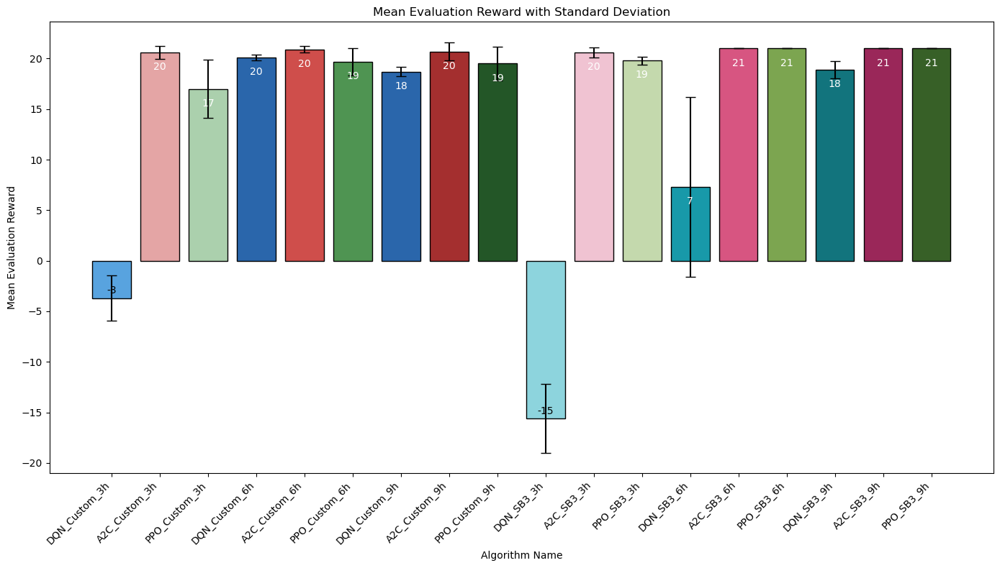

In [81]:
# Visualize the rewards in the test environment
plot_comparisons_in_grid(
    data,
    algorithms=all_algorithms,
    plot_functions=[plot_mean_evaluation_rewards],
    grid_size=(1, 1),
    thresholds=[0, 10, 21],
    sigma=2
)

In [82]:
summary_df 

,Algorithm Name,Mean Eval Reward,Std Eval Reward,Total Steps,Total Episodes,Average Timesteps per Episode,Threshold Episode,Threshold Timestep,Threshold Times
0,DQN_Custom_3h,-3.7,2.238303,780788.0,571,1367.404553,N/A,N/A,N/A
1,A2C_Custom_3h,20.6,0.663325,9278464.0,6123,1515.346072,"0: 4597, 10: 4638, 21: 4876",N/A,"0: 7527.344767093658, 10: 7667.682003974915, 2..."
2,PPO_Custom_3h,17.0,2.898275,2870272.0,1594,1800.672522,"0: 823, 10: 823",N/A,"0: 4246.178800106049, 10: 4246.178800106049"
3,DQN_Custom_6h,20.1,0.300000,1476532.0,802,1841.062344,"0: 675, 10: 785",N/A,"0: 15793.13505911827, 10: 21006.26523900032"
4,A2C_Custom_6h,20.9,0.300000,18467840.0,9896,1866.192401,"0: 2789, 10: 2844, 21: 6098",N/A,"0: 3853.843549966812, 10: 4035.3577687740326, ..."
5,PPO_Custom_6h,19.7,1.345362,5901312.0,2917,2023.075763,"0: 823, 10: 823",N/A,"0: 4270.358438253403, 10: 4270.358438253403"
6,DQN_Custom_9h,18.7,0.458258,2155108.0,1197,1800.424394,"0: 629, 10: 660",N/A,"0: 13975.719340085983, 10: 15228.85398387909"
7,A2C_Custom_9h,20.7,0.900000,27022336.0,12929,2090.056153,"0: 3456, 10: 3622, 21: 4719",N/A,"0: 6123.525858163834, 10: 6747.516723155975, 2..."
8,PPO_Custom_9h,19.5,1.688194,8514560.0,4074,2089.975454,"0: 823, 10: 823, 21: 2958",N/A,"0: 4437.955960035324, 10: 4437.955960035324, 2..."
9,DQN_SB3_3h,-15.6,3.382307,1170206.0,1744,5375.774194,N/A,N/A,N/A
